In [55]:
%matplotlib inline

import os
import sys
import math
import zipfile
import itertools
import random

import tqdm
import requests
import numba
import pandas as pd
import numpy as np
from scipy.special import softmax
from matplotlib import pyplot as plt
from matplotlib.colors import hsv_to_rgb

In [2]:
DATA_HOST = "https://archive.ics.uci.edu"
DATA_PATH = "/ml/machine-learning-databases/00321/"
ARCHIVE_NAME = "LD2011_2014.txt.zip"
FILE_NAME = ARCHIVE_NAME[:-4]

In [3]:
if not os.path.isfile(FILE_NAME):
    print("downloading dataset (258MB), can take a few minutes depending on your connection")
    
    response = requests.get(DATA_HOST + DATA_PATH + ARCHIVE_NAME, ARCHIVE_NAME, stream=True)
    total_size_in_bytes = int(response.headers.get('content-length', 0))
    block_size = 1024 #1 Kibibyte
    progress_bar = tqdm.tqdm(total=total_size_in_bytes, unit='iB', unit_scale=True)
    with open(ARCHIVE_NAME, 'wb') as file:
        for data in response.iter_content(block_size):
            progress_bar.update(len(data))
            file.write(data)

    print("\nextracting data archive")
    zip_ref = zipfile.ZipFile(ARCHIVE_NAME, 'r')
    zip_ref.extractall("./")
    zip_ref.close()
else:
    print("File found skipping download")

File found skipping download


In [4]:
data = pd.read_csv(FILE_NAME, sep=";", index_col=0, parse_dates=True, decimal=',')
num_timeseries = data.shape[1]
data_kw = data.resample('1D').sum() / 8
timeseries = []
for i in range(num_timeseries):
    timeseries.append(np.trim_zeros(data_kw.iloc[:,i], trim='f'))

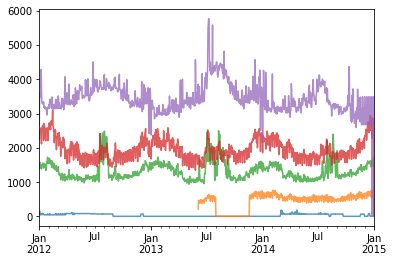

In [5]:
for t in random.sample(timeseries, k=5):
    t.plot(alpha=0.75)

In [6]:
dfs = []
for t in timeseries:
    df = pd.DataFrame({
        f'{timescale_name}_{fn.__name__}': t.index.map(
            lambda x: fn(2 * math.pi / period * x.toordinal())
        )
        for timescale_name, period in {
            'dow': 7, 'dom': 30, 'doy': 365.25, 'dod': 3652.5
        }.items()
        for fn in (math.cos, math.sin)
    })
    df['demand'] = t.values
    df.index = t.index
    dfs.append(df)

# STEP ONE
In step one, we'll just have the key be the result of applying a binary mask to the fourier-transformed date components

In [7]:
masks = np.unpackbits(np.array([
    sum(combo) 
    for combo in itertools.combinations([
        2 ** i 
        for i in range(8)
    ], 3)
], dtype=np.uint8).reshape(-1, 1), axis=1)
masks

array([[0, 0, 0, 0, 0, 1, 1, 1],
       [0, 0, 0, 0, 1, 0, 1, 1],
       [0, 0, 0, 1, 0, 0, 1, 1],
       [0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 0, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 1],
       [0, 0, 0, 0, 1, 1, 0, 1],
       [0, 0, 0, 1, 0, 1, 0, 1],
       [0, 0, 1, 0, 0, 1, 0, 1],
       [0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1],
       [0, 0, 0, 1, 1, 0, 0, 1],
       [0, 0, 1, 0, 1, 0, 0, 1],
       [0, 1, 0, 0, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 1],
       [0, 0, 1, 1, 0, 0, 0, 1],
       [0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 1, 0, 0, 0, 0, 1],
       [1, 1, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1, 1, 1, 0],
       [0, 0, 0, 1, 0, 1, 1, 0],
       [0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 0, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 0],
       [0, 0, 0, 1, 1, 0, 1, 0],
       [0, 0, 1, 0, 1, 0, 1, 0],
       [0, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0],
       [0,

In [8]:
len(masks)

56

In [9]:
@numba.jit
def preds(df, mask):
    keys = df.drop('demand', axis=1).values
    xs = df['demand'].values
    ys = []
    loss = 0
    for i in range(1, len(keys)):
        masked_values = mask * keys[:i]
        target = mask * keys[i]
        exp_products = np.exp(masked_values @ target)
        attention = exp_products / np.sum(exp_products)
        y = xs[:i] @ attention
        loss += (xs[i] - y) ** 2
        ys.append(y)
    rmse = math.sqrt(loss / len(df))
    return np.array(ys), rmse

In [10]:
def plot_all_masks(df):
    min_loss = float('inf')
    min_loss_mask = None
    min_loss_mask_name = None
    for mask in masks:
        ys, loss = preds(df, mask)
        mask_name = ' + '.join(
            colname 
            for include, colname in zip(mask, df.columns)
            if include
        )

        if loss < min_loss:
            min_loss, min_loss_mask, min_loss_mask_name = loss, mask, mask_name

        plt.plot(df.index[1:], df.demand[1:], label='true')
        plt.plot(df.index[1:], ys, label='pred', alpha=0.9)
        plt.title(f"{mask_name} ({loss:.0f})")
        plt.legend()
        plt.show()
        plt.close()

    print(min_loss_mask_name, min_loss_mask, min_loss)

In [64]:
def plot_best_mask(df):
    best_mask = min(masks, key=lambda m: preds(df, m)[-1])
    
    ys, loss = preds(df, best_mask)
    mask_name = ' + '.join(
        colname 
        for include, colname in zip(best_mask, df.columns)
        if include
    )
    plt.plot(df.index[1:], df.demand[1:], label='true')
    plt.plot(df.index[1:], ys, label='pred', alpha=0.8)
    
#     df_plottable = df[[
#         col
#         for include, col in zip(best_mask, df.columns)
#         if include
#     ]]
#     colors = {
#         i: hsv_to_rgb(hsv)
#         for i, hsv in zip(
#             df.index[1:], 
#             df_plottable.values[1:]
#         )
#     }
#     for (i, rgb), y in zip(colors.items(), df.demand[1:]):
#         plt.axline(i, ymax=y, color=rgb)
    
    plt.title(f"{mask_name} ({loss:.0f})")
    plt.legend()
    plt.show()
    plt.close()

  0%|                                                                                       | 0/370 [00:00<?, ?it/s]

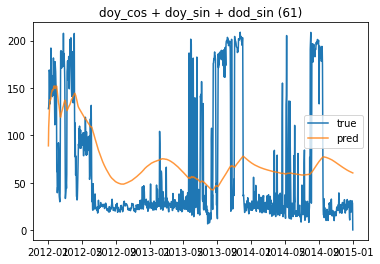

  0%|▏                                                                              | 1/370 [00:03<22:21,  3.64s/it]

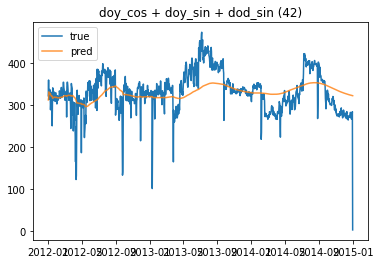

  1%|▍                                                                              | 2/370 [00:06<21:19,  3.48s/it]

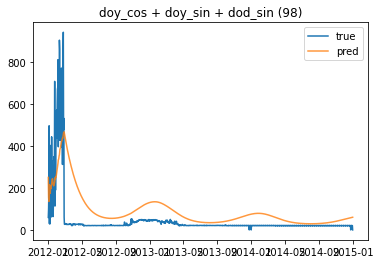

  1%|▋                                                                              | 3/370 [00:09<20:36,  3.37s/it]

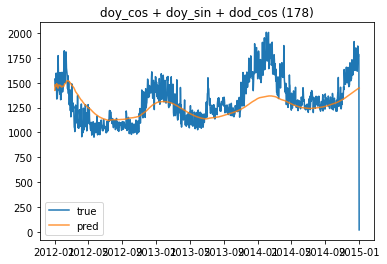

  1%|▊                                                                              | 4/370 [00:13<20:58,  3.44s/it]

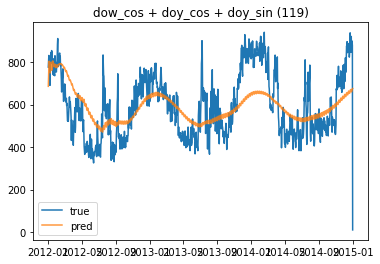

  1%|█                                                                              | 5/370 [00:16<19:34,  3.22s/it]

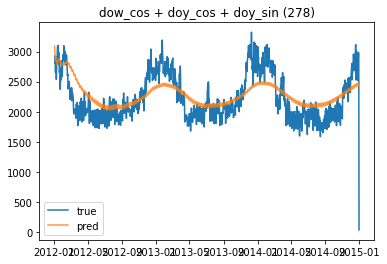

  2%|█▎                                                                             | 6/370 [00:19<19:26,  3.21s/it]

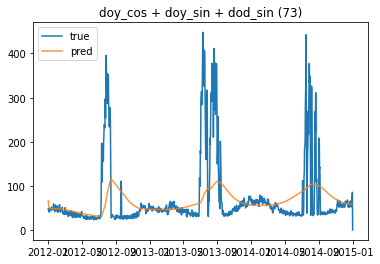

  2%|█▍                                                                             | 7/370 [00:21<18:14,  3.02s/it]

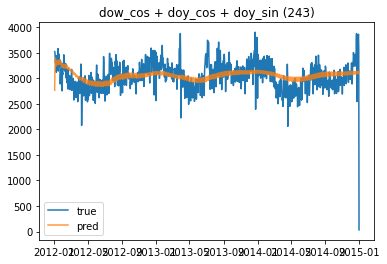

  2%|█▋                                                                             | 8/370 [00:24<17:28,  2.90s/it]

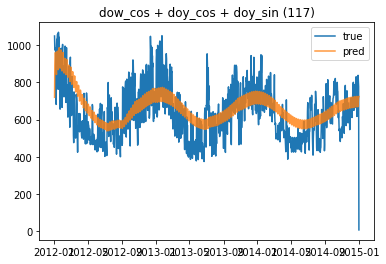

  2%|█▉                                                                             | 9/370 [00:26<16:20,  2.72s/it]

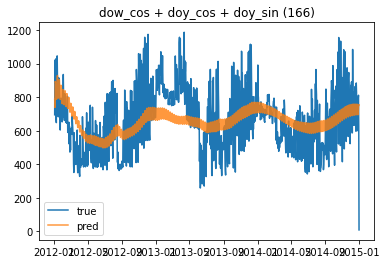

  3%|██                                                                            | 10/370 [00:28<15:16,  2.55s/it]

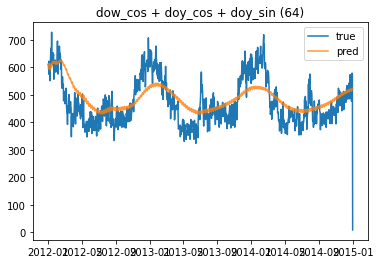

  3%|██▎                                                                           | 11/370 [00:30<14:09,  2.37s/it]

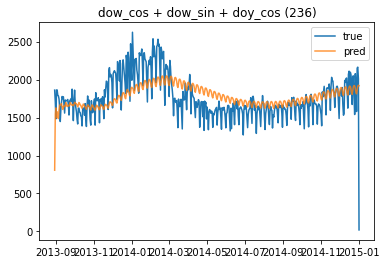

  3%|██▌                                                                           | 12/370 [00:31<11:32,  1.93s/it]

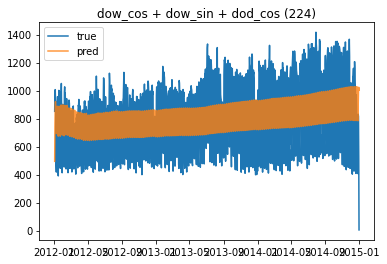

  4%|██▋                                                                           | 13/370 [00:33<11:23,  1.91s/it]

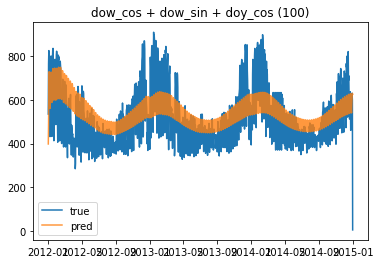

  4%|██▉                                                                           | 14/370 [00:35<11:15,  1.90s/it]

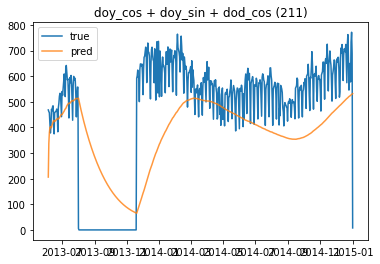

  4%|███▏                                                                          | 15/370 [00:36<09:33,  1.61s/it]

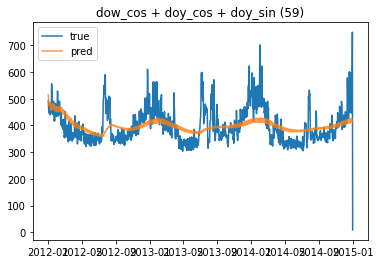

  4%|███▎                                                                          | 16/370 [00:38<10:05,  1.71s/it]

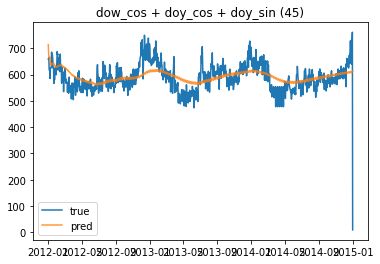

  5%|███▌                                                                          | 17/370 [00:40<10:18,  1.75s/it]

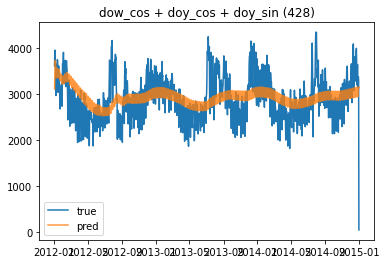

  5%|███▊                                                                          | 18/370 [00:42<10:21,  1.77s/it]

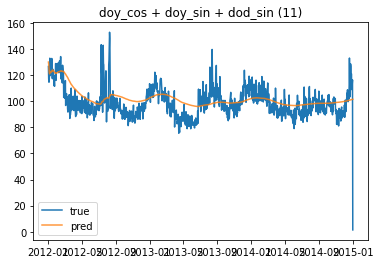

  5%|████                                                                          | 19/370 [00:43<10:25,  1.78s/it]

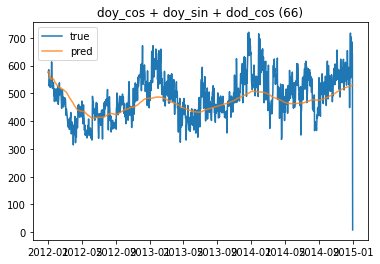

  5%|████▏                                                                         | 20/370 [00:45<10:30,  1.80s/it]

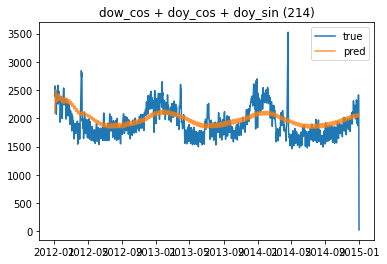

  6%|████▍                                                                         | 21/370 [00:47<10:37,  1.83s/it]

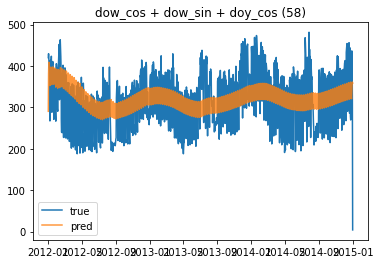

  6%|████▋                                                                         | 22/370 [00:49<10:36,  1.83s/it]

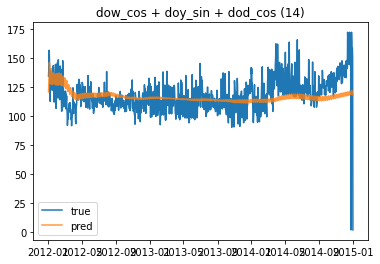

  6%|████▊                                                                         | 23/370 [00:51<10:32,  1.82s/it]

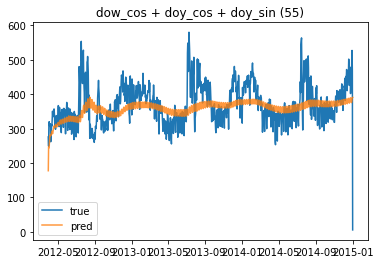

  6%|█████                                                                         | 24/370 [00:52<10:14,  1.78s/it]

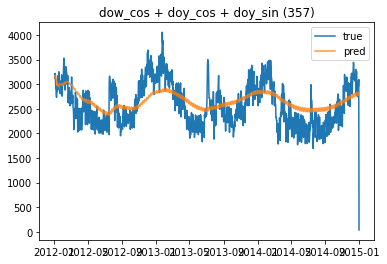

  7%|█████▎                                                                        | 25/370 [00:54<10:18,  1.79s/it]

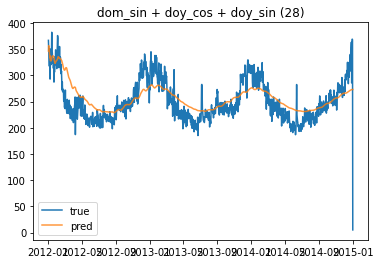

  7%|█████▍                                                                        | 26/370 [00:56<10:18,  1.80s/it]

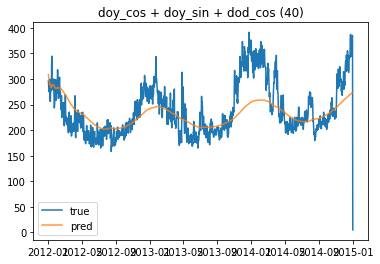

  7%|█████▋                                                                        | 27/370 [00:58<10:19,  1.81s/it]

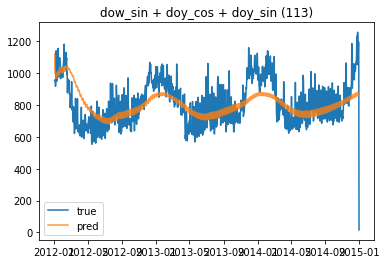

  8%|█████▉                                                                        | 28/370 [01:00<10:20,  1.81s/it]

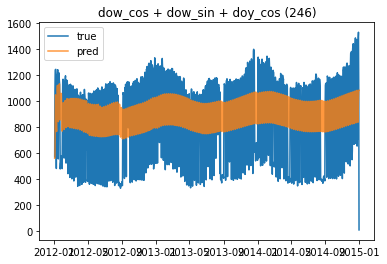

  8%|██████                                                                        | 29/370 [01:02<10:21,  1.82s/it]

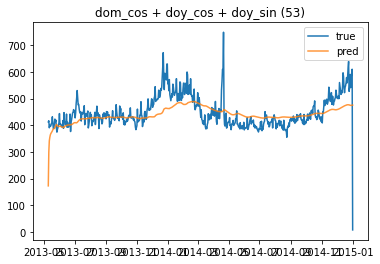

  8%|██████▎                                                                       | 30/370 [01:03<08:51,  1.56s/it]

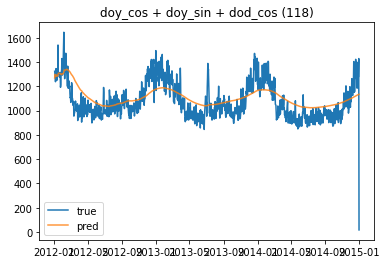

  8%|██████▌                                                                       | 31/370 [01:04<09:15,  1.64s/it]

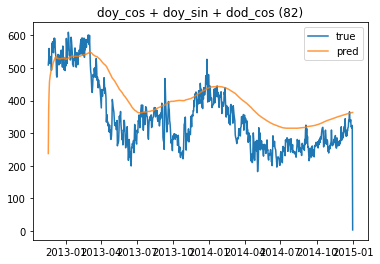

  9%|██████▋                                                                       | 32/370 [01:06<08:34,  1.52s/it]

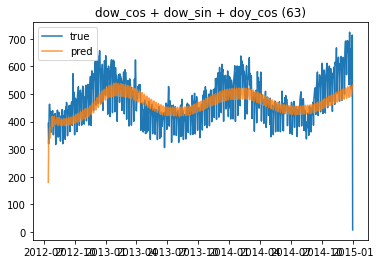

  9%|██████▉                                                                       | 33/370 [01:07<08:29,  1.51s/it]

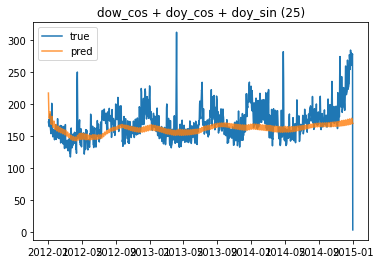

  9%|███████▏                                                                      | 34/370 [01:09<09:01,  1.61s/it]

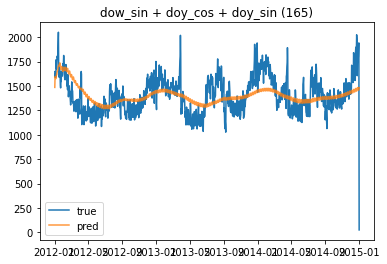

  9%|███████▍                                                                      | 35/370 [01:11<09:25,  1.69s/it]

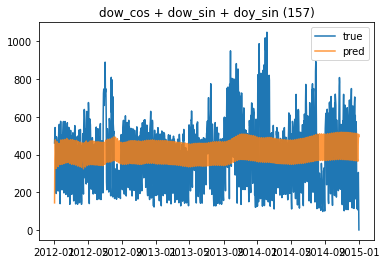

 10%|███████▌                                                                      | 36/370 [01:13<10:10,  1.83s/it]

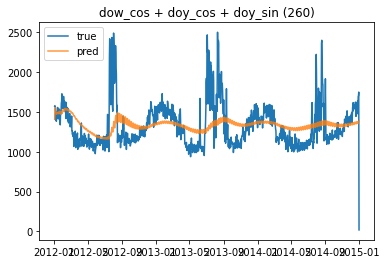

 10%|███████▊                                                                      | 37/370 [01:15<10:16,  1.85s/it]

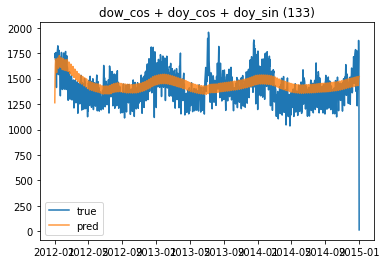

 10%|████████                                                                      | 38/370 [01:17<10:33,  1.91s/it]

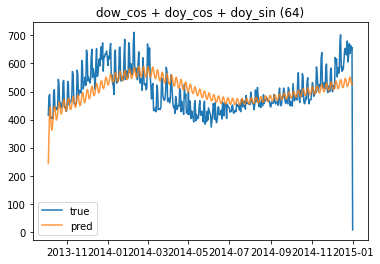

 11%|████████▏                                                                     | 39/370 [01:18<08:34,  1.56s/it]

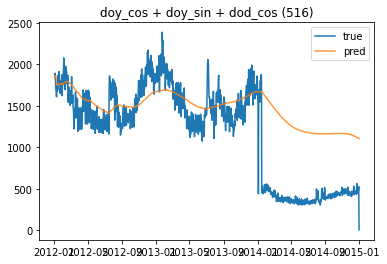

 11%|████████▍                                                                     | 40/370 [01:20<09:05,  1.65s/it]

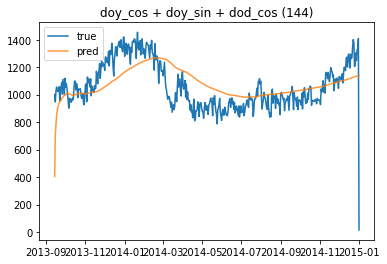

 11%|████████▋                                                                     | 41/370 [01:20<07:35,  1.38s/it]

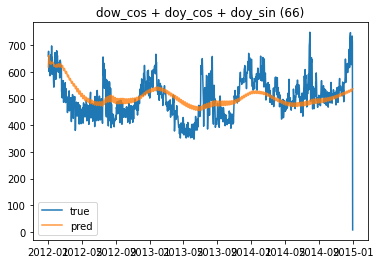

 11%|████████▊                                                                     | 42/370 [01:22<08:22,  1.53s/it]

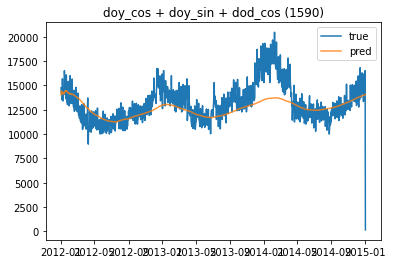

 12%|█████████                                                                     | 43/370 [01:24<08:58,  1.65s/it]

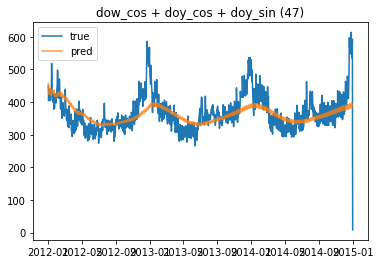

 12%|█████████▎                                                                    | 44/370 [01:26<09:16,  1.71s/it]

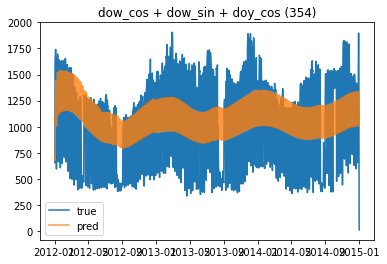

 12%|█████████▍                                                                    | 45/370 [01:28<09:33,  1.77s/it]

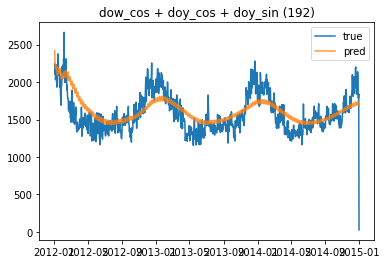

 12%|█████████▋                                                                    | 46/370 [01:30<09:52,  1.83s/it]

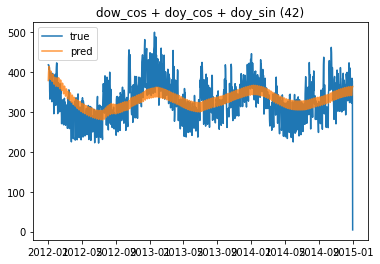

 13%|█████████▉                                                                    | 47/370 [01:32<10:19,  1.92s/it]

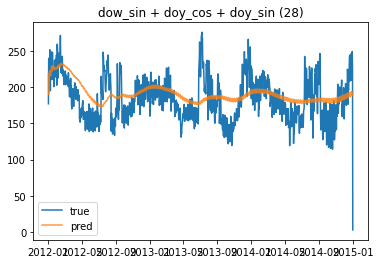

 13%|██████████                                                                    | 48/370 [01:34<10:33,  1.97s/it]

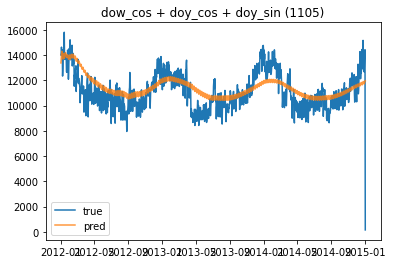

 13%|██████████▎                                                                   | 49/370 [01:36<10:23,  1.94s/it]

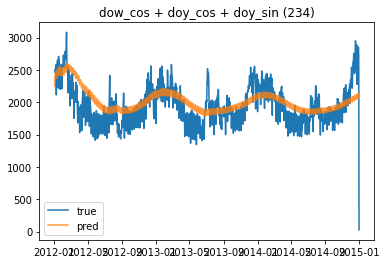

 14%|██████████▌                                                                   | 50/370 [01:38<10:15,  1.92s/it]

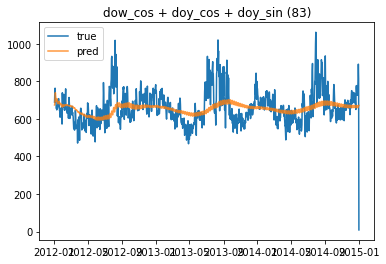

 14%|██████████▊                                                                   | 51/370 [01:40<10:25,  1.96s/it]

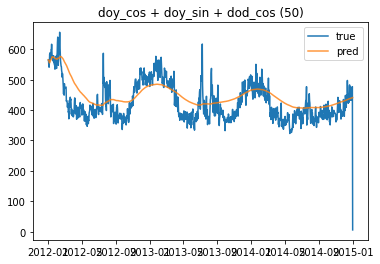

 14%|██████████▉                                                                   | 52/370 [01:42<10:31,  1.99s/it]

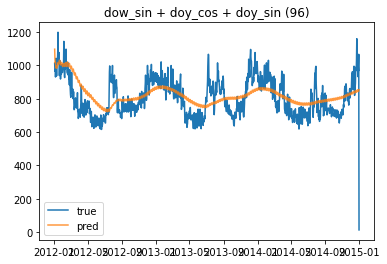

 14%|███████████▏                                                                  | 53/370 [01:44<10:41,  2.02s/it]

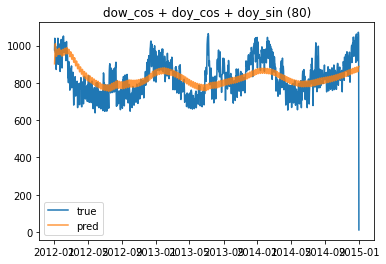

 15%|███████████▍                                                                  | 54/370 [01:46<10:32,  2.00s/it]

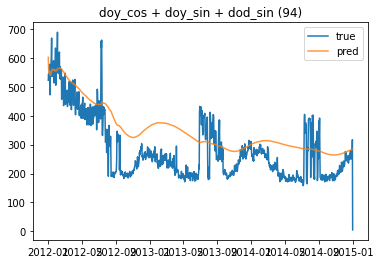

 15%|███████████▌                                                                  | 55/370 [01:48<10:32,  2.01s/it]

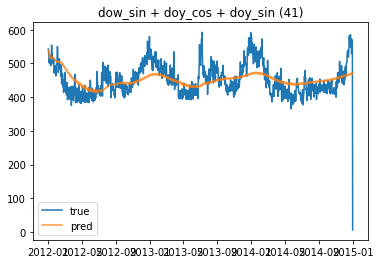

 15%|███████████▊                                                                  | 56/370 [01:50<10:36,  2.03s/it]

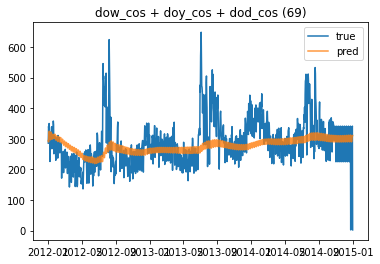

 15%|████████████                                                                  | 57/370 [01:52<10:40,  2.05s/it]

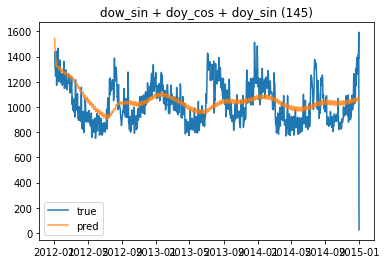

 16%|████████████▏                                                                 | 58/370 [01:54<10:44,  2.07s/it]

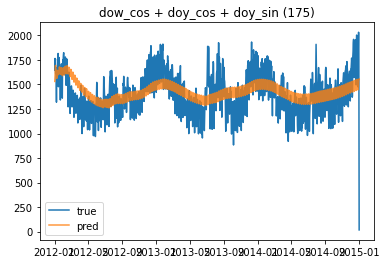

 16%|████████████▍                                                                 | 59/370 [01:56<10:27,  2.02s/it]

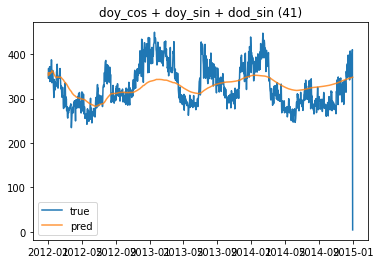

 16%|████████████▋                                                                 | 60/370 [01:58<10:14,  1.98s/it]

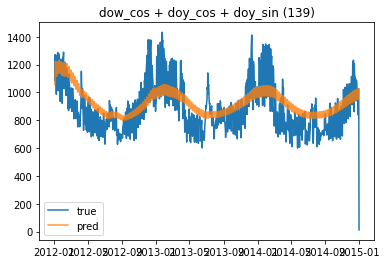

 16%|████████████▊                                                                 | 61/370 [02:00<10:12,  1.98s/it]

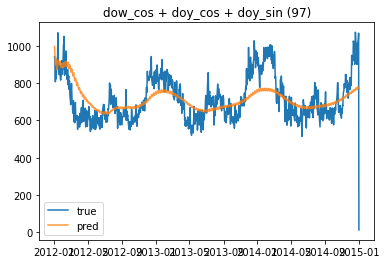

 17%|█████████████                                                                 | 62/370 [02:02<10:01,  1.95s/it]

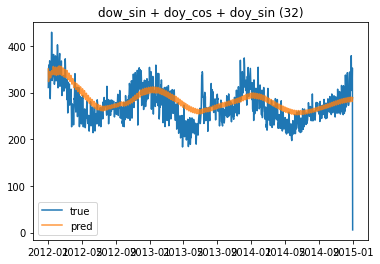

 17%|█████████████▎                                                                | 63/370 [02:04<09:53,  1.93s/it]

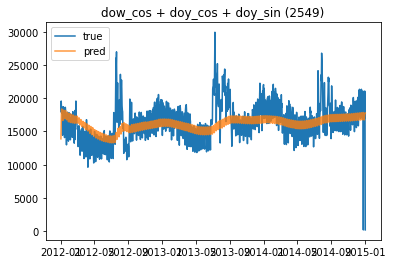

 17%|█████████████▍                                                                | 64/370 [02:06<09:42,  1.90s/it]

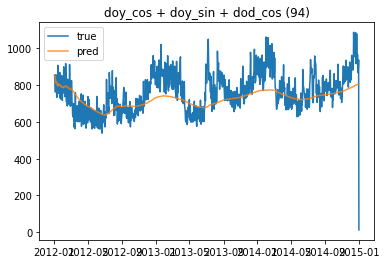

 18%|█████████████▋                                                                | 65/370 [02:07<09:36,  1.89s/it]

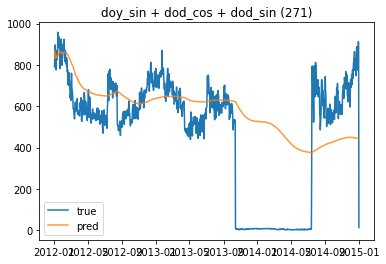

 18%|█████████████▉                                                                | 66/370 [02:10<10:12,  2.01s/it]

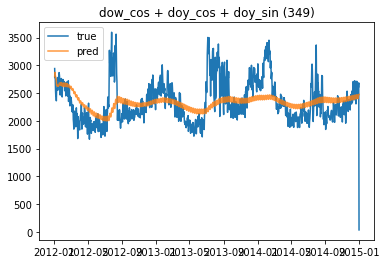

 18%|██████████████                                                                | 67/370 [02:12<10:10,  2.02s/it]

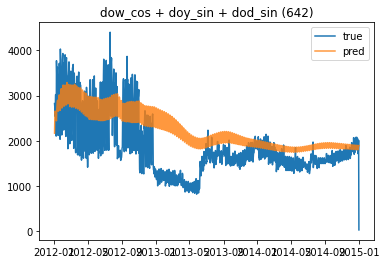

 18%|██████████████▎                                                               | 68/370 [02:14<10:03,  2.00s/it]

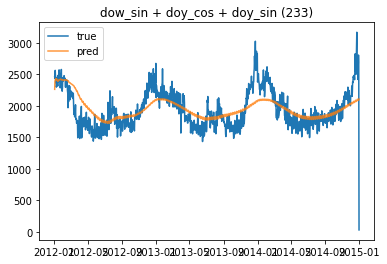

 19%|██████████████▌                                                               | 69/370 [02:16<10:06,  2.01s/it]

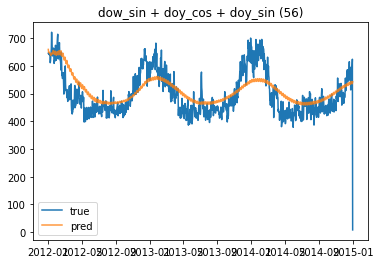

 19%|██████████████▊                                                               | 70/370 [02:18<10:27,  2.09s/it]

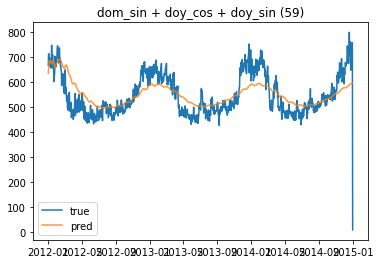

 19%|██████████████▉                                                               | 71/370 [02:20<10:39,  2.14s/it]

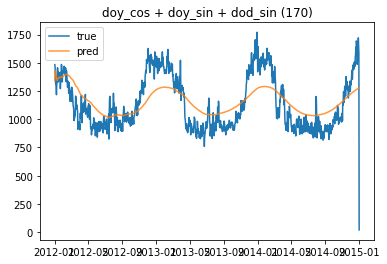

 19%|███████████████▏                                                              | 72/370 [02:23<10:58,  2.21s/it]

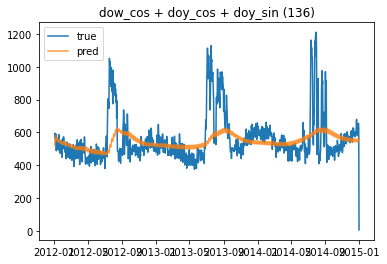

 20%|███████████████▍                                                              | 73/370 [02:25<11:02,  2.23s/it]

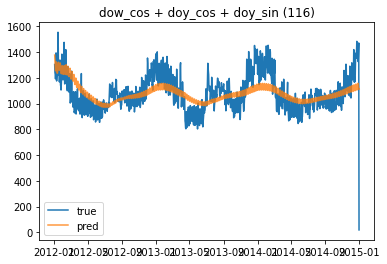

 20%|███████████████▌                                                              | 74/370 [02:27<10:52,  2.21s/it]

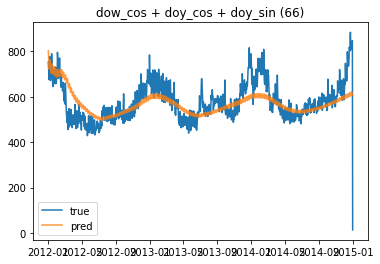

 20%|███████████████▊                                                              | 75/370 [02:29<10:55,  2.22s/it]

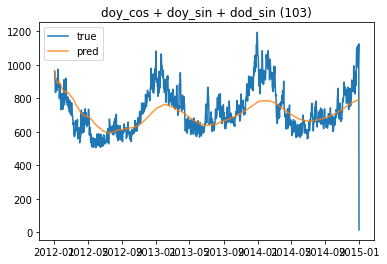

 21%|████████████████                                                              | 76/370 [02:32<11:10,  2.28s/it]

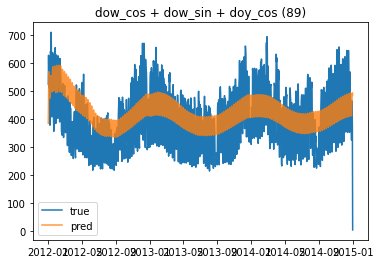

 21%|████████████████▏                                                             | 77/370 [02:34<11:18,  2.32s/it]

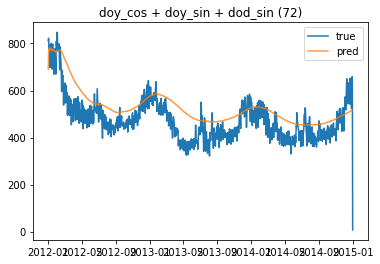

 21%|████████████████▍                                                             | 78/370 [02:36<11:10,  2.30s/it]

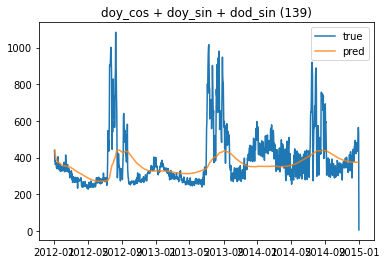

 21%|████████████████▋                                                             | 79/370 [02:39<10:53,  2.25s/it]

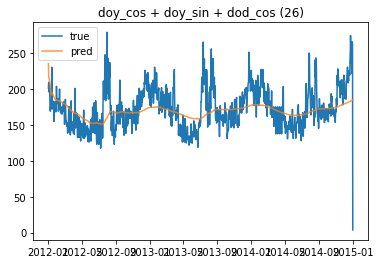

 22%|████████████████▊                                                             | 80/370 [02:41<10:41,  2.21s/it]

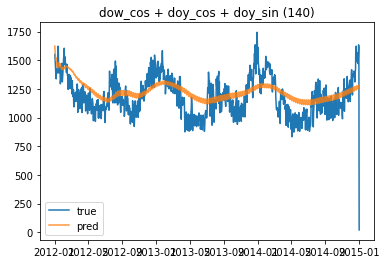

 22%|█████████████████                                                             | 81/370 [02:43<10:13,  2.12s/it]

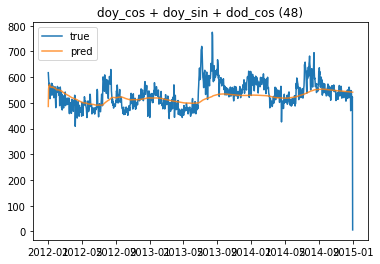

 22%|█████████████████▎                                                            | 82/370 [02:45<09:47,  2.04s/it]

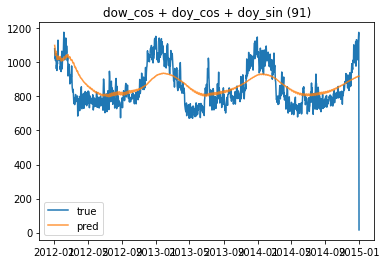

 22%|█████████████████▍                                                            | 83/370 [02:46<09:29,  1.99s/it]

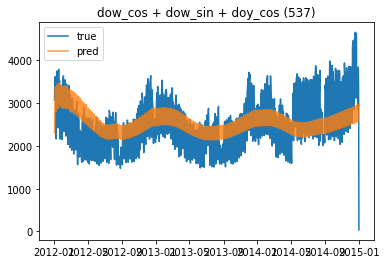

 23%|█████████████████▋                                                            | 84/370 [02:48<09:35,  2.01s/it]

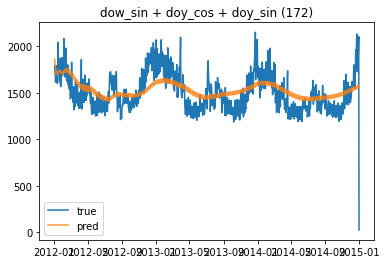

 23%|█████████████████▉                                                            | 85/370 [02:51<09:41,  2.04s/it]

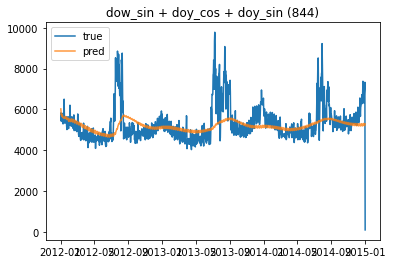

 23%|██████████████████▏                                                           | 86/370 [02:53<09:40,  2.04s/it]

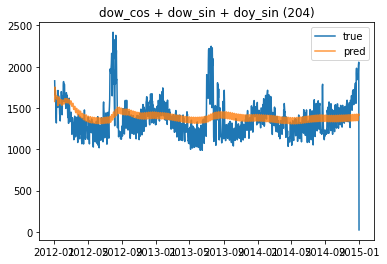

 24%|██████████████████▎                                                           | 87/370 [02:55<09:42,  2.06s/it]

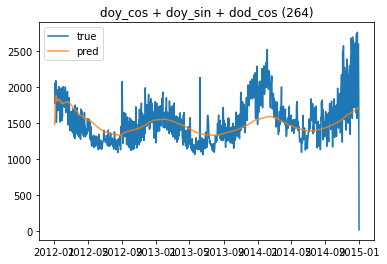

 24%|██████████████████▌                                                           | 88/370 [02:57<09:40,  2.06s/it]

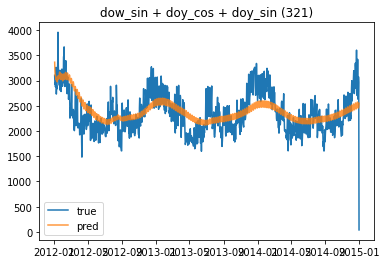

 24%|██████████████████▊                                                           | 89/370 [02:59<09:44,  2.08s/it]

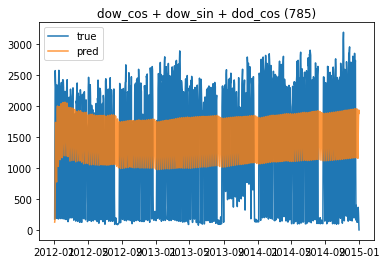

 24%|██████████████████▉                                                           | 90/370 [03:01<09:46,  2.09s/it]

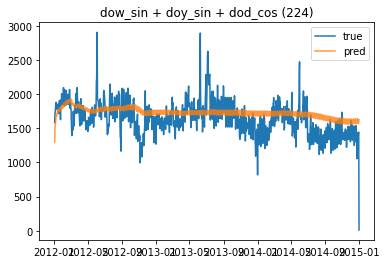

 25%|███████████████████▏                                                          | 91/370 [03:03<09:48,  2.11s/it]

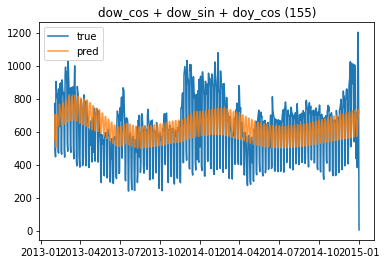

 25%|███████████████████▍                                                          | 92/370 [03:04<08:38,  1.87s/it]

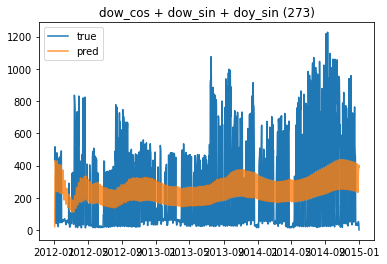

 25%|███████████████████▌                                                          | 93/370 [03:06<08:40,  1.88s/it]

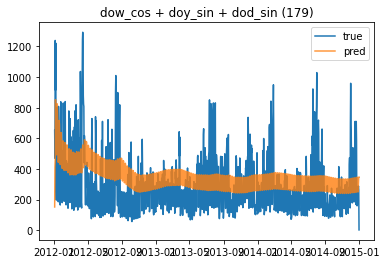

 25%|███████████████████▊                                                          | 94/370 [03:08<08:55,  1.94s/it]

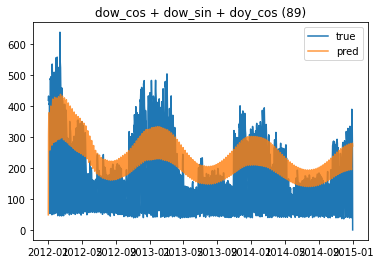

 26%|████████████████████                                                          | 95/370 [03:11<09:12,  2.01s/it]

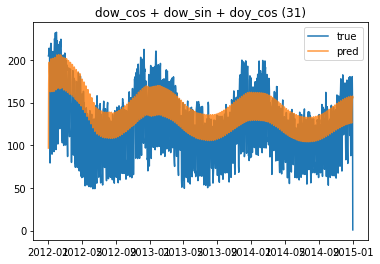

 26%|████████████████████▏                                                         | 96/370 [03:13<09:25,  2.06s/it]

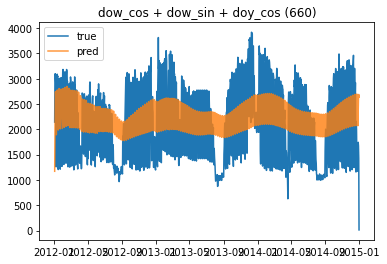

 26%|████████████████████▍                                                         | 97/370 [03:15<09:19,  2.05s/it]

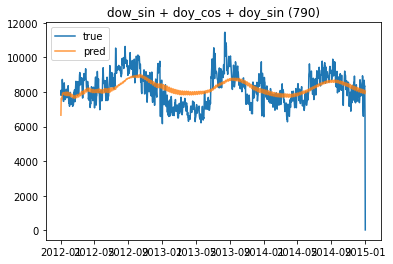

 26%|████████████████████▋                                                         | 98/370 [03:17<09:28,  2.09s/it]

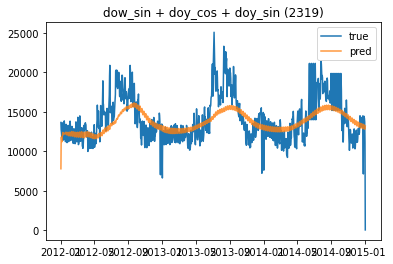

 27%|████████████████████▊                                                         | 99/370 [03:19<09:32,  2.11s/it]

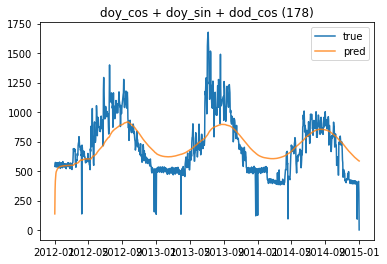

 27%|████████████████████▊                                                        | 100/370 [03:21<09:42,  2.16s/it]

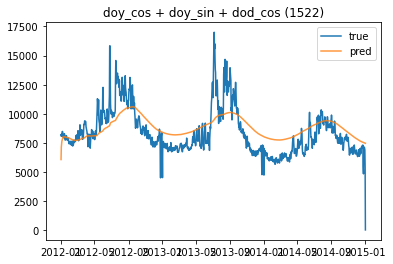

 27%|█████████████████████                                                        | 101/370 [03:24<09:34,  2.13s/it]

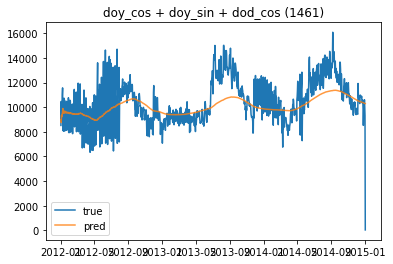

 28%|█████████████████████▏                                                       | 102/370 [03:26<09:37,  2.16s/it]

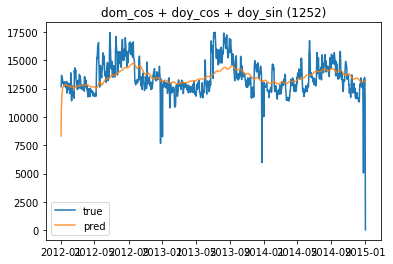

 28%|█████████████████████▍                                                       | 103/370 [03:28<09:38,  2.17s/it]

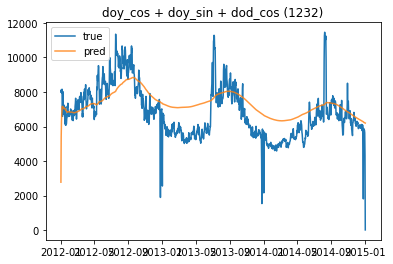

 28%|█████████████████████▋                                                       | 104/370 [03:30<09:33,  2.15s/it]

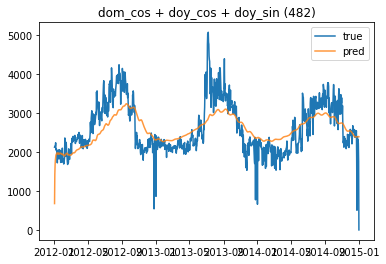

 28%|█████████████████████▊                                                       | 105/370 [03:32<09:28,  2.14s/it]

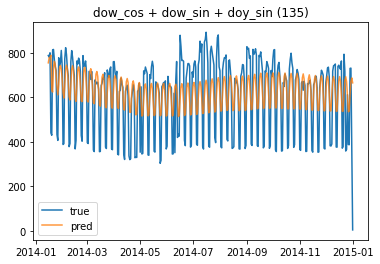

 29%|██████████████████████                                                       | 106/370 [03:33<07:31,  1.71s/it]

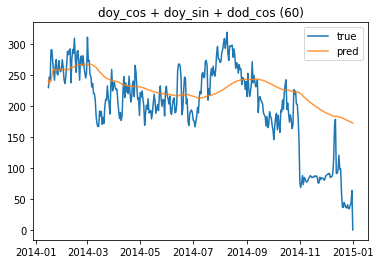

 29%|██████████████████████▎                                                      | 107/370 [03:34<06:11,  1.41s/it]

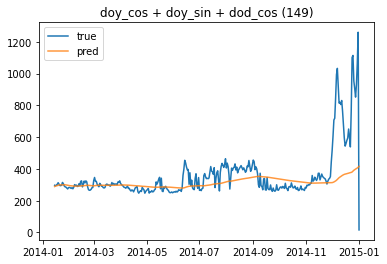

 29%|██████████████████████▍                                                      | 108/370 [03:34<05:17,  1.21s/it]

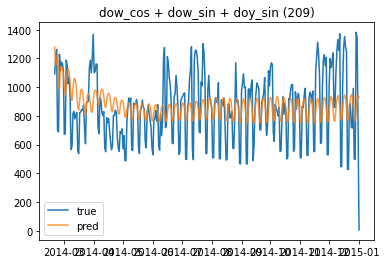

 29%|██████████████████████▋                                                      | 109/370 [03:35<04:42,  1.08s/it]

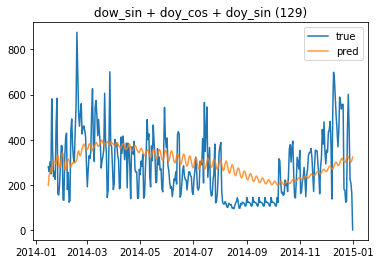

 30%|██████████████████████▉                                                      | 110/370 [03:36<04:09,  1.04it/s]

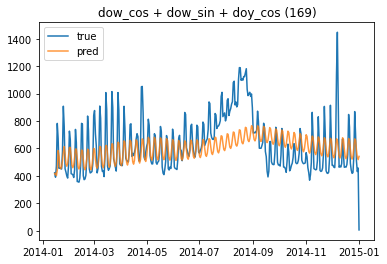

 30%|███████████████████████                                                      | 111/370 [03:36<03:46,  1.14it/s]

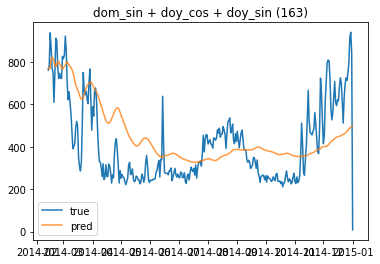

 30%|███████████████████████▎                                                     | 112/370 [03:37<03:28,  1.24it/s]

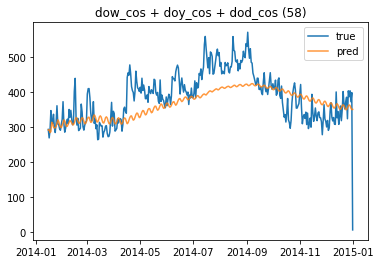

 31%|███████████████████████▌                                                     | 113/370 [03:38<03:17,  1.30it/s]

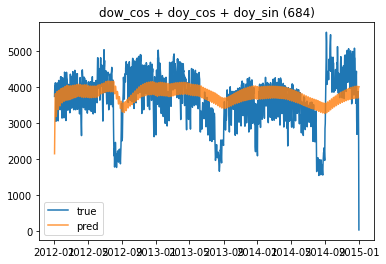

 31%|███████████████████████▋                                                     | 114/370 [03:40<05:03,  1.18s/it]

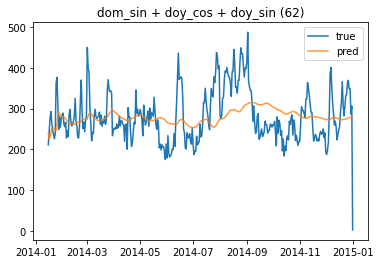

 31%|███████████████████████▉                                                     | 115/370 [03:41<04:23,  1.03s/it]

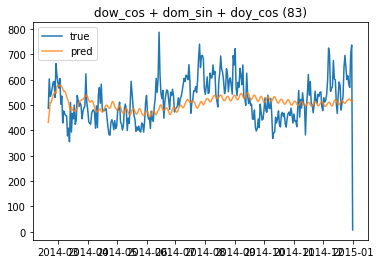

 31%|████████████████████████▏                                                    | 116/370 [03:41<03:53,  1.09it/s]

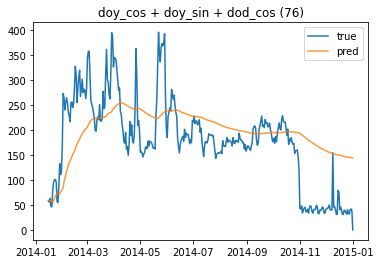

 32%|████████████████████████▎                                                    | 117/370 [03:42<03:35,  1.17it/s]

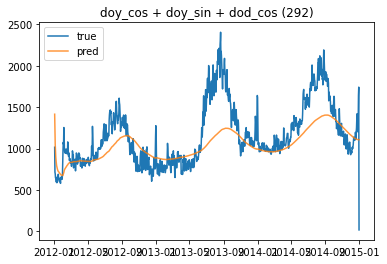

 32%|████████████████████████▌                                                    | 118/370 [03:44<05:12,  1.24s/it]

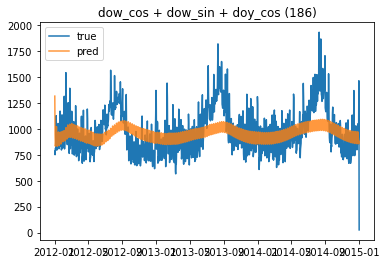

 32%|████████████████████████▊                                                    | 119/370 [03:46<06:30,  1.56s/it]

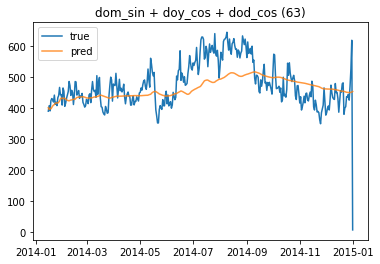

 32%|████████████████████████▉                                                    | 120/370 [03:47<05:22,  1.29s/it]

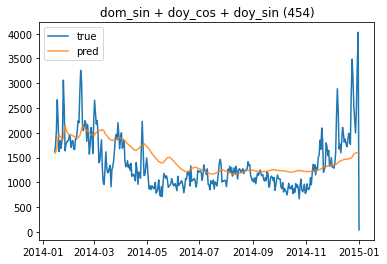

 33%|█████████████████████████▏                                                   | 121/370 [03:48<04:38,  1.12s/it]

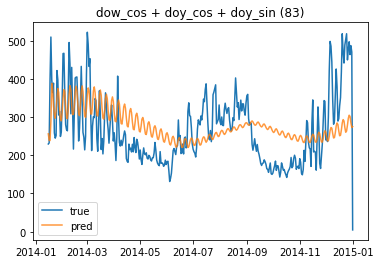

 33%|█████████████████████████▍                                                   | 122/370 [03:48<04:01,  1.03it/s]

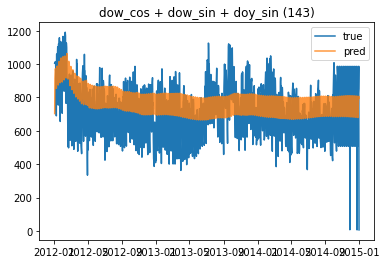

 33%|█████████████████████████▌                                                   | 123/370 [03:51<05:30,  1.34s/it]

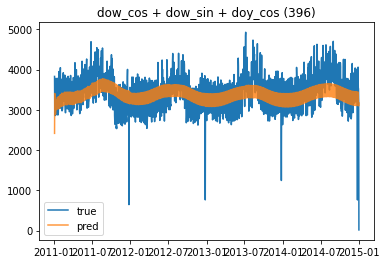

 34%|█████████████████████████▊                                                   | 124/370 [03:55<09:43,  2.37s/it]

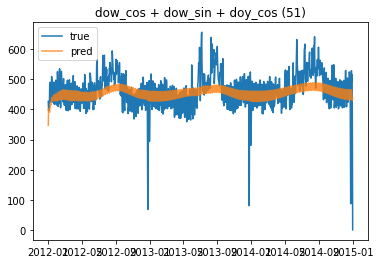

 34%|██████████████████████████                                                   | 125/370 [03:58<09:23,  2.30s/it]

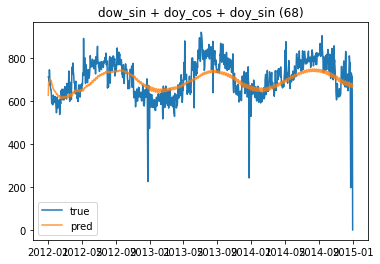

 34%|██████████████████████████▏                                                  | 126/370 [04:00<09:11,  2.26s/it]

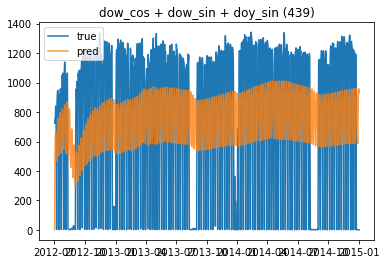

 34%|██████████████████████████▍                                                  | 127/370 [04:01<08:31,  2.11s/it]

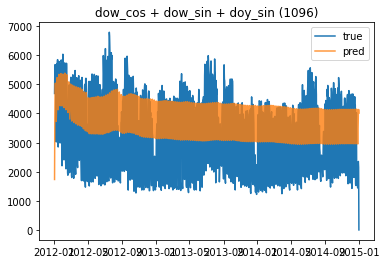

 35%|██████████████████████████▋                                                  | 128/370 [04:04<08:29,  2.10s/it]

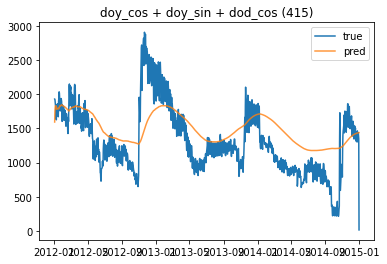

 35%|██████████████████████████▊                                                  | 129/370 [04:06<08:30,  2.12s/it]

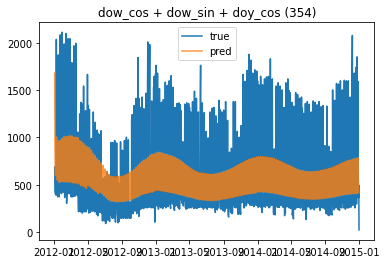

 35%|███████████████████████████                                                  | 130/370 [04:08<08:27,  2.11s/it]

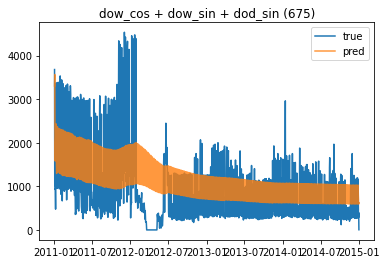

 35%|███████████████████████████▎                                                 | 131/370 [04:12<11:27,  2.88s/it]

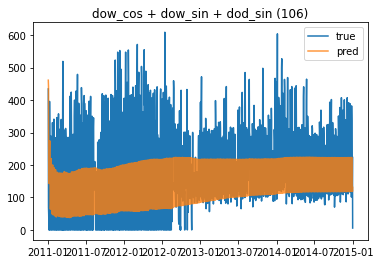

 36%|███████████████████████████▍                                                 | 132/370 [04:17<13:33,  3.42s/it]

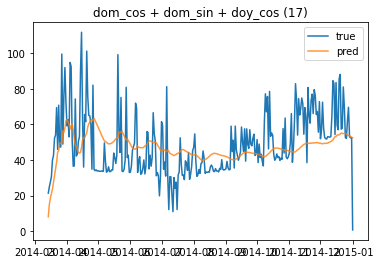

 36%|███████████████████████████▋                                                 | 133/370 [04:18<10:16,  2.60s/it]

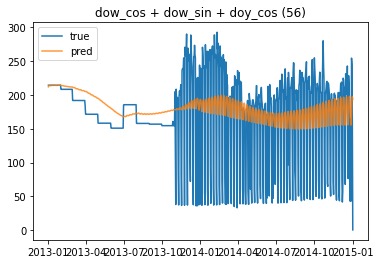

 36%|███████████████████████████▉                                                 | 134/370 [04:19<08:43,  2.22s/it]

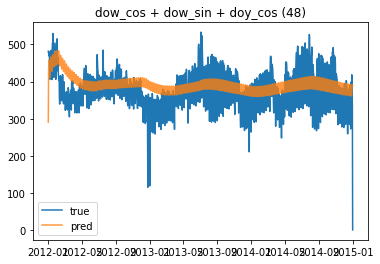

 36%|████████████████████████████                                                 | 135/370 [04:21<08:34,  2.19s/it]

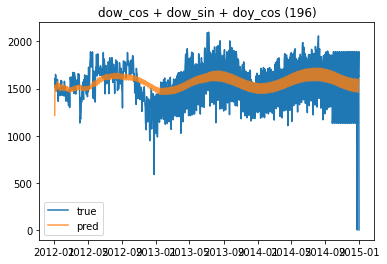

 37%|████████████████████████████▎                                                | 136/370 [04:23<08:25,  2.16s/it]

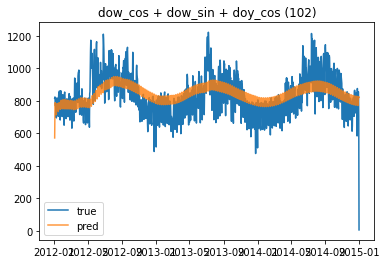

 37%|████████████████████████████▌                                                | 137/370 [04:25<08:19,  2.14s/it]

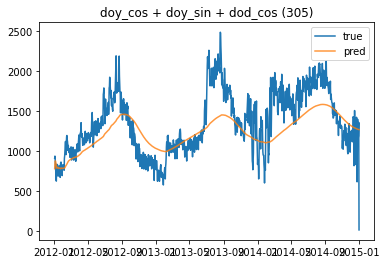

 37%|████████████████████████████▋                                                | 138/370 [04:28<08:10,  2.11s/it]

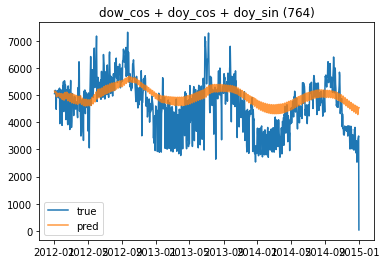

 38%|████████████████████████████▉                                                | 139/370 [04:30<08:08,  2.12s/it]

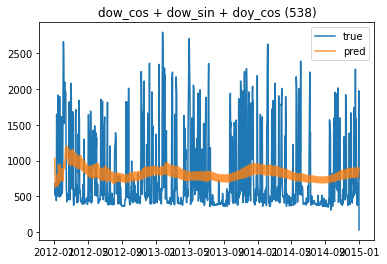

 38%|█████████████████████████████▏                                               | 140/370 [04:32<08:06,  2.11s/it]

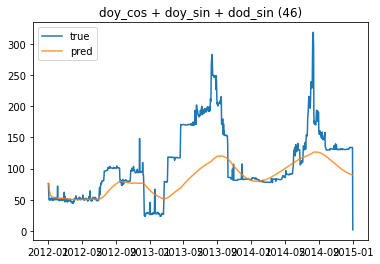

 38%|█████████████████████████████▎                                               | 141/370 [04:34<07:59,  2.09s/it]

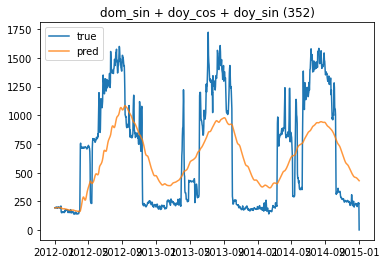

 38%|█████████████████████████████▌                                               | 142/370 [04:36<07:58,  2.10s/it]

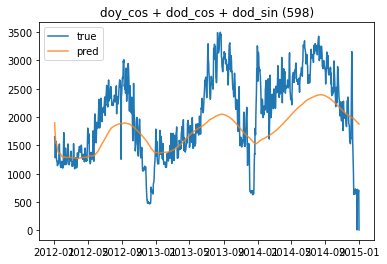

 39%|█████████████████████████████▊                                               | 143/370 [04:38<07:55,  2.09s/it]

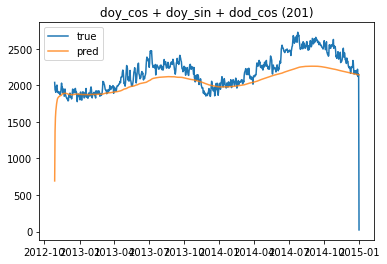

 39%|█████████████████████████████▉                                               | 144/370 [04:39<07:10,  1.90s/it]

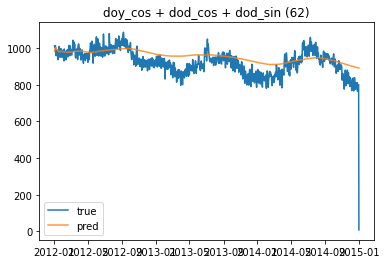

 39%|██████████████████████████████▏                                              | 145/370 [04:42<07:21,  1.96s/it]

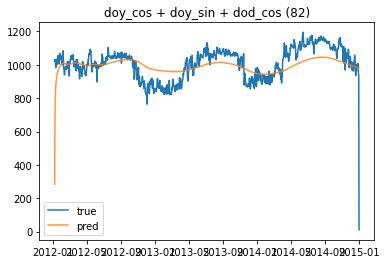

 39%|██████████████████████████████▍                                              | 146/370 [04:44<07:42,  2.06s/it]

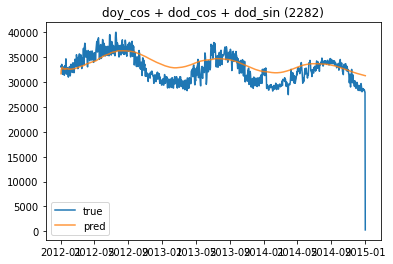

 40%|██████████████████████████████▌                                              | 147/370 [04:46<07:44,  2.08s/it]

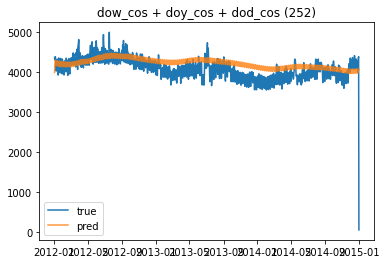

 40%|██████████████████████████████▊                                              | 148/370 [04:48<07:46,  2.10s/it]

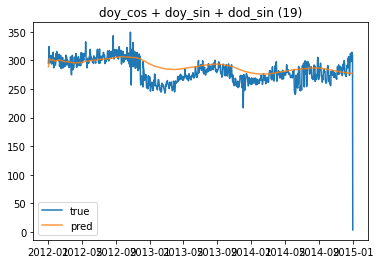

 40%|███████████████████████████████                                              | 149/370 [04:50<07:41,  2.09s/it]

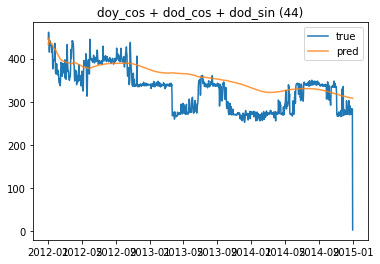

 41%|███████████████████████████████▏                                             | 150/370 [04:52<07:40,  2.10s/it]

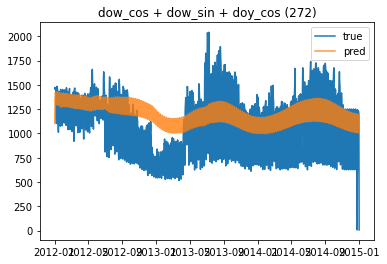

 41%|███████████████████████████████▍                                             | 151/370 [04:54<07:43,  2.11s/it]

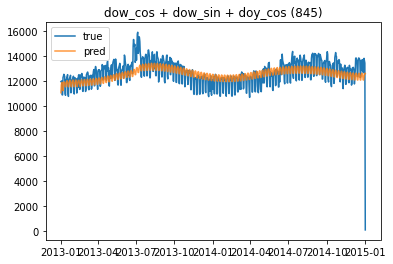

 41%|███████████████████████████████▋                                             | 152/370 [04:56<06:51,  1.89s/it]

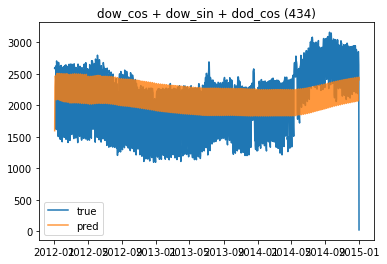

 41%|███████████████████████████████▊                                             | 153/370 [04:58<07:05,  1.96s/it]

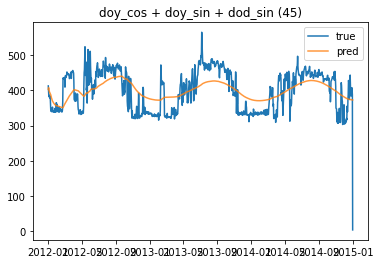

 42%|████████████████████████████████                                             | 154/370 [05:00<07:12,  2.00s/it]

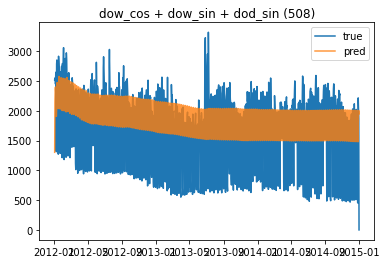

 42%|████████████████████████████████▎                                            | 155/370 [05:02<07:09,  2.00s/it]

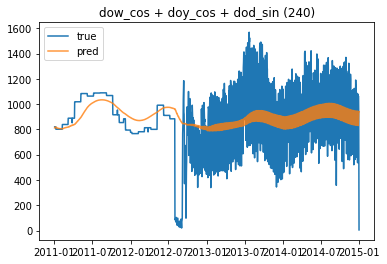

 42%|████████████████████████████████▍                                            | 156/370 [05:07<09:56,  2.79s/it]

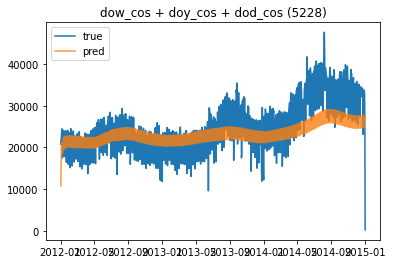

 42%|████████████████████████████████▋                                            | 157/370 [05:09<09:13,  2.60s/it]

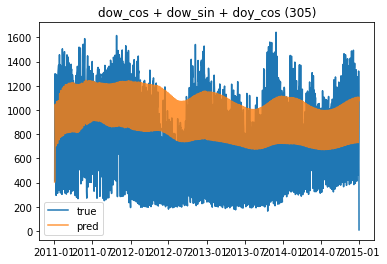

 43%|████████████████████████████████▉                                            | 158/370 [05:13<11:23,  3.22s/it]

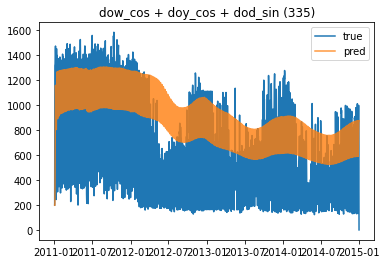

 43%|█████████████████████████████████                                            | 159/370 [05:18<12:47,  3.64s/it]

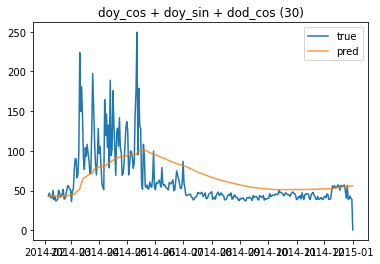

 43%|█████████████████████████████████▎                                           | 160/370 [05:19<09:34,  2.74s/it]

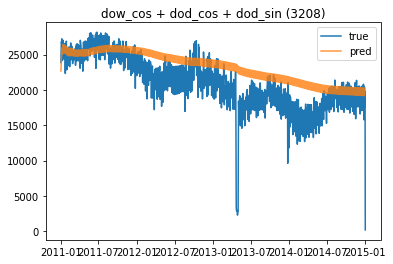

 44%|█████████████████████████████████▌                                           | 161/370 [05:23<11:34,  3.32s/it]

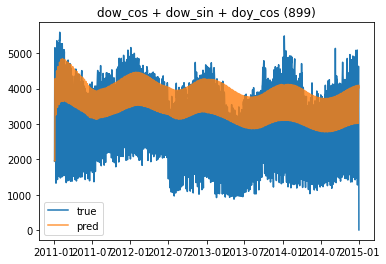

 44%|█████████████████████████████████▋                                           | 162/370 [05:28<12:40,  3.66s/it]

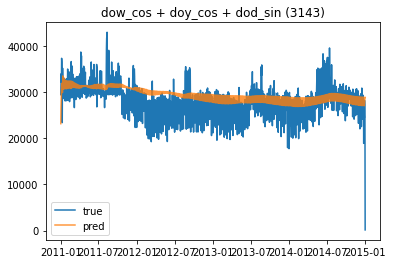

 44%|█████████████████████████████████▉                                           | 163/370 [05:32<13:36,  3.94s/it]

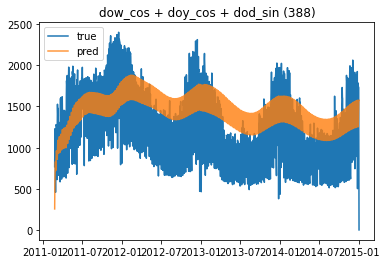

 44%|██████████████████████████████████▏                                          | 164/370 [05:37<13:48,  4.02s/it]

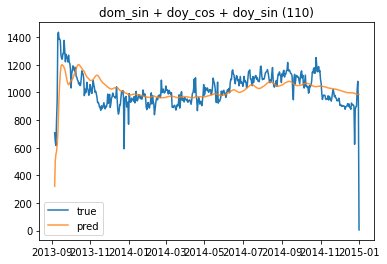

 45%|██████████████████████████████████▎                                          | 165/370 [05:38<10:32,  3.08s/it]

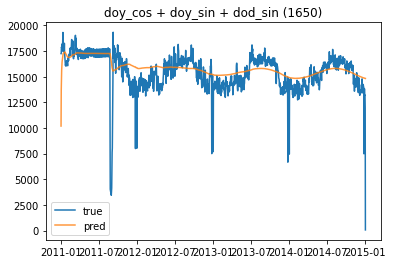

 45%|██████████████████████████████████▌                                          | 166/370 [05:42<12:02,  3.54s/it]

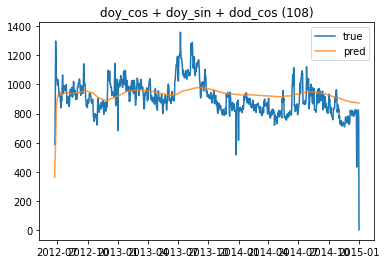

 45%|██████████████████████████████████▊                                          | 167/370 [05:44<10:09,  3.00s/it]

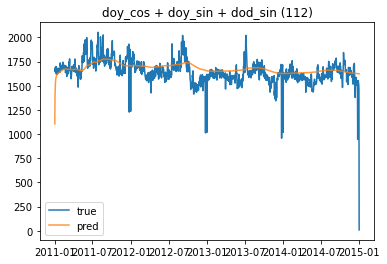

 45%|██████████████████████████████████▉                                          | 168/370 [05:49<11:42,  3.48s/it]

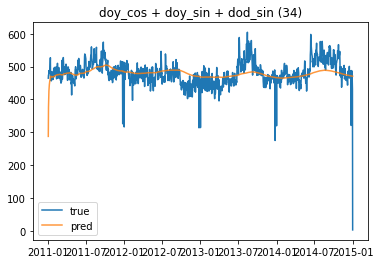

 46%|███████████████████████████████████▏                                         | 169/370 [05:53<12:40,  3.78s/it]

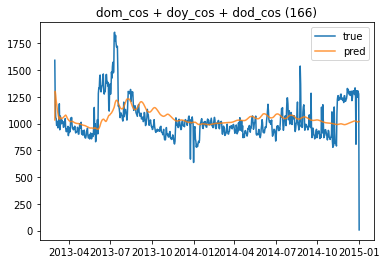

 46%|███████████████████████████████████▍                                         | 170/370 [05:54<10:04,  3.02s/it]

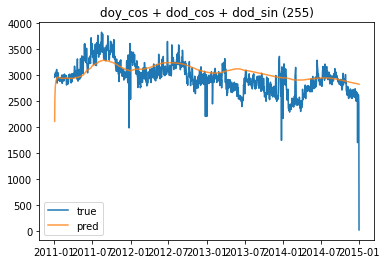

 46%|███████████████████████████████████▌                                         | 171/370 [05:59<11:37,  3.51s/it]

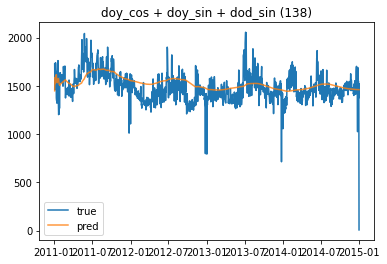

 46%|███████████████████████████████████▊                                         | 172/370 [06:03<12:38,  3.83s/it]

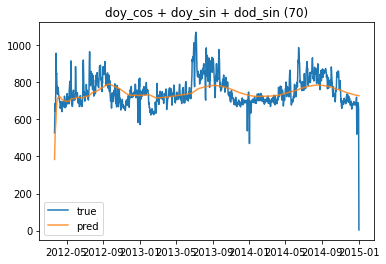

 47%|████████████████████████████████████                                         | 173/370 [06:05<10:38,  3.24s/it]

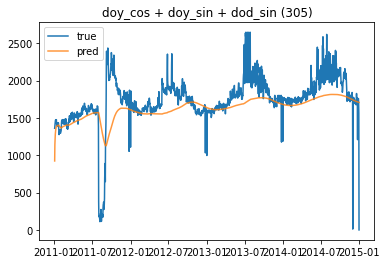

 47%|████████████████████████████████████▏                                        | 174/370 [06:10<11:51,  3.63s/it]

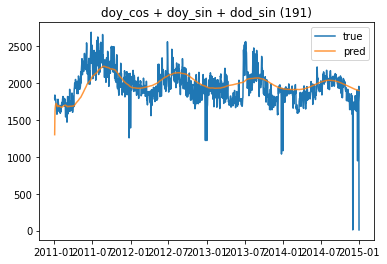

 47%|████████████████████████████████████▍                                        | 175/370 [06:15<12:47,  3.93s/it]

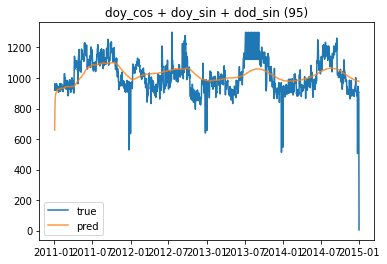

 48%|████████████████████████████████████▋                                        | 176/370 [06:19<13:27,  4.16s/it]

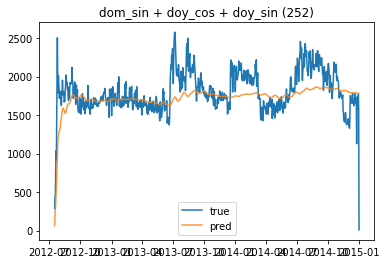

 48%|████████████████████████████████████▊                                        | 177/370 [06:21<11:01,  3.43s/it]

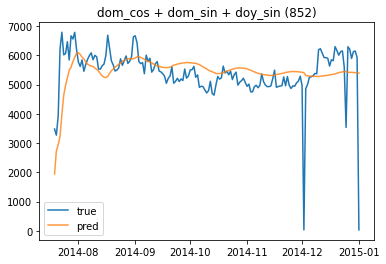

 48%|█████████████████████████████████████                                        | 178/370 [06:21<08:02,  2.51s/it]

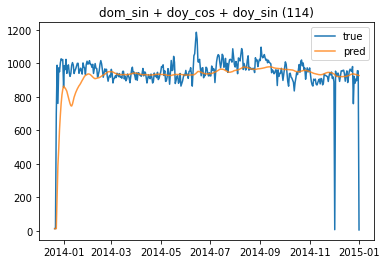

 48%|█████████████████████████████████████▎                                       | 179/370 [06:22<06:14,  1.96s/it]

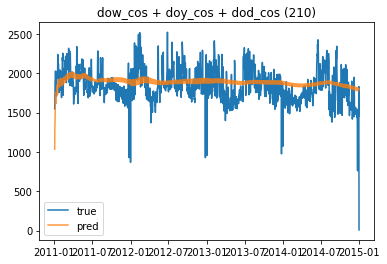

 49%|█████████████████████████████████████▍                                       | 180/370 [06:27<08:39,  2.73s/it]

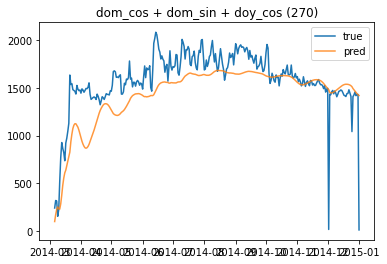

 49%|█████████████████████████████████████▋                                       | 181/370 [06:27<06:33,  2.08s/it]

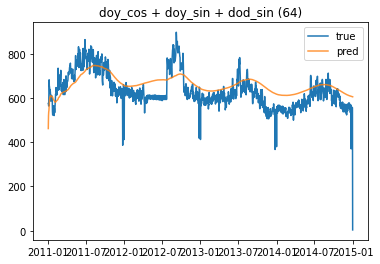

 49%|█████████████████████████████████████▉                                       | 182/370 [06:32<08:45,  2.79s/it]

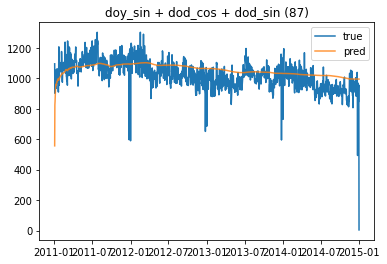

 49%|██████████████████████████████████████                                       | 183/370 [06:36<10:31,  3.38s/it]

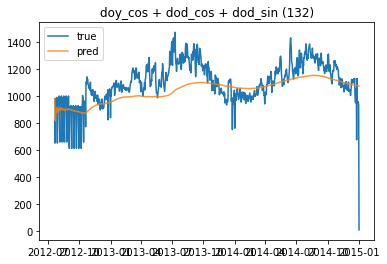

 50%|██████████████████████████████████████▎                                      | 184/370 [06:38<08:53,  2.87s/it]

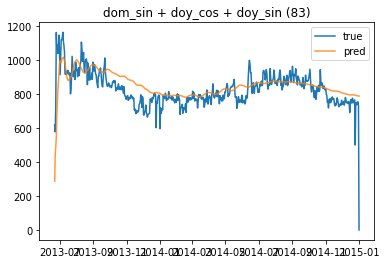

 50%|██████████████████████████████████████▌                                      | 185/370 [06:39<07:07,  2.31s/it]

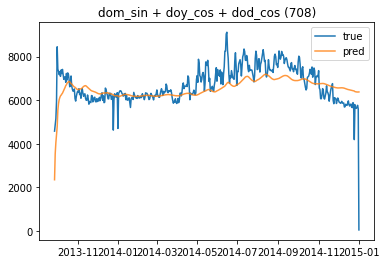

 50%|██████████████████████████████████████▋                                      | 186/370 [06:40<05:40,  1.85s/it]

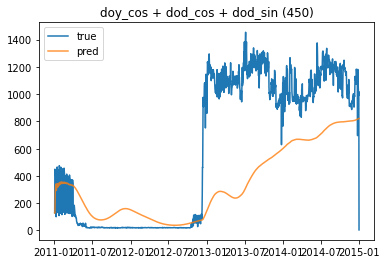

 51%|██████████████████████████████████████▉                                      | 187/370 [06:44<08:04,  2.65s/it]

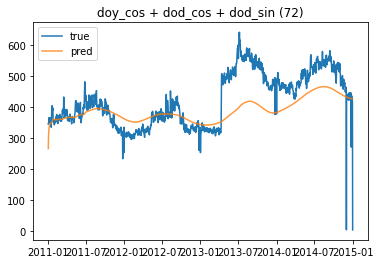

 51%|███████████████████████████████████████                                      | 188/370 [06:49<09:42,  3.20s/it]

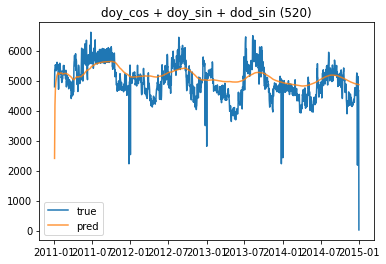

 51%|███████████████████████████████████████▎                                     | 189/370 [06:53<10:46,  3.57s/it]

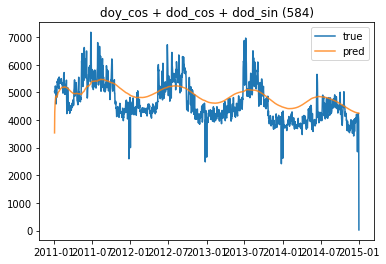

 51%|███████████████████████████████████████▌                                     | 190/370 [06:58<11:28,  3.82s/it]

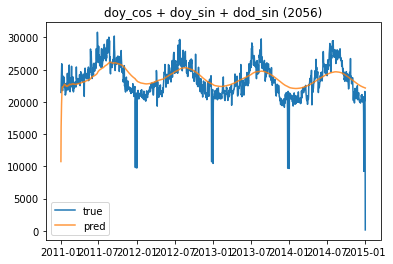

 52%|███████████████████████████████████████▋                                     | 191/370 [07:02<11:58,  4.01s/it]

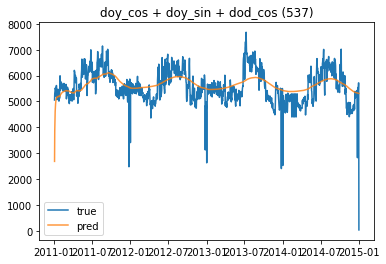

 52%|███████████████████████████████████████▉                                     | 192/370 [07:07<12:18,  4.15s/it]

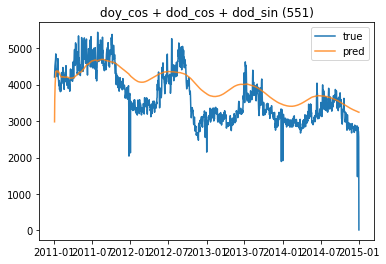

 52%|████████████████████████████████████████▏                                    | 193/370 [07:11<12:31,  4.25s/it]

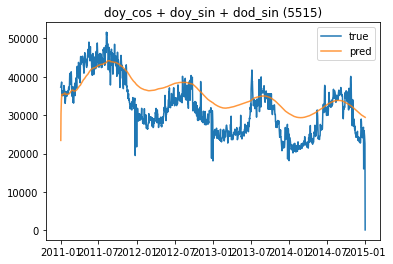

 52%|████████████████████████████████████████▎                                    | 194/370 [07:15<12:35,  4.29s/it]

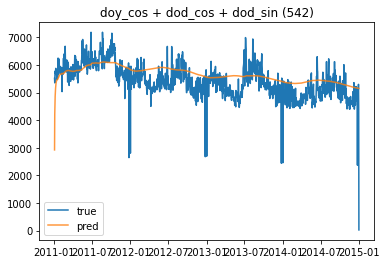

 53%|████████████████████████████████████████▌                                    | 195/370 [07:20<12:43,  4.36s/it]

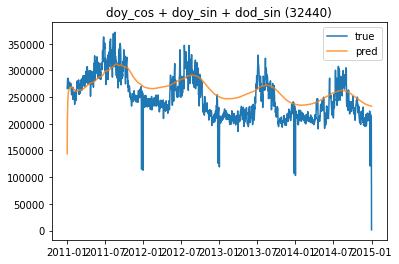

 53%|████████████████████████████████████████▊                                    | 196/370 [07:24<12:46,  4.40s/it]

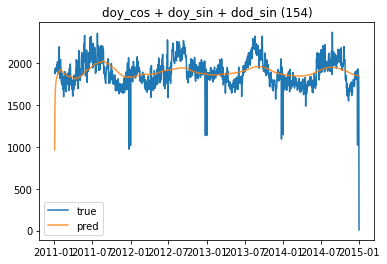

 53%|████████████████████████████████████████▉                                    | 197/370 [07:29<12:43,  4.42s/it]

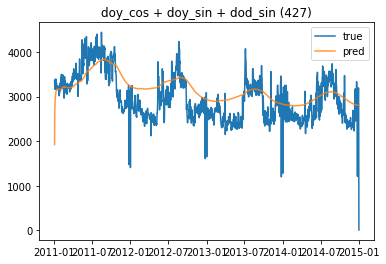

 54%|█████████████████████████████████████████▏                                   | 198/370 [07:33<12:46,  4.46s/it]

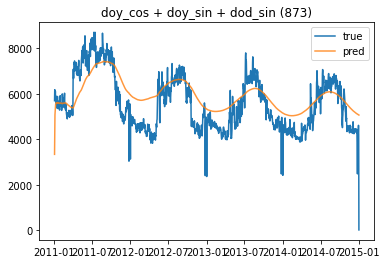

 54%|█████████████████████████████████████████▍                                   | 199/370 [07:38<12:44,  4.47s/it]

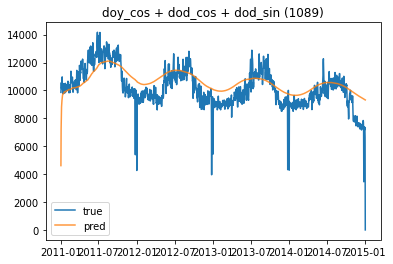

 54%|█████████████████████████████████████████▌                                   | 200/370 [07:42<12:42,  4.48s/it]

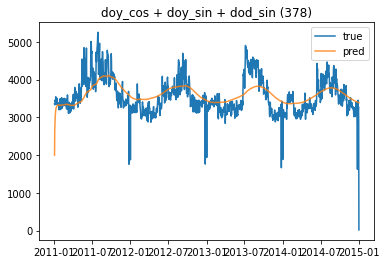

 54%|█████████████████████████████████████████▊                                   | 201/370 [07:47<12:38,  4.49s/it]

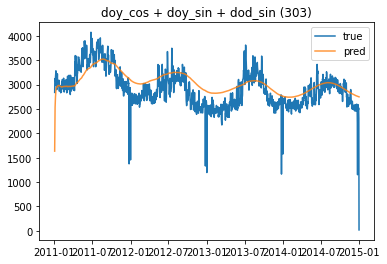

 55%|██████████████████████████████████████████                                   | 202/370 [07:51<12:34,  4.49s/it]

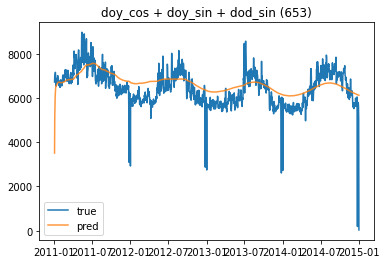

 55%|██████████████████████████████████████████▏                                  | 203/370 [07:56<12:25,  4.47s/it]

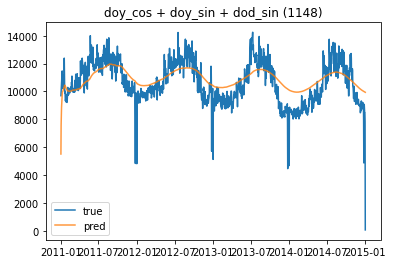

 55%|██████████████████████████████████████████▍                                  | 204/370 [08:00<12:20,  4.46s/it]

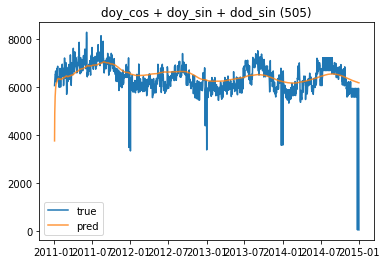

 55%|██████████████████████████████████████████▋                                  | 205/370 [08:05<12:12,  4.44s/it]

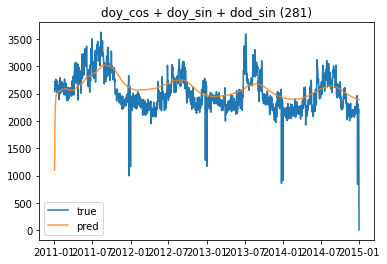

 56%|██████████████████████████████████████████▊                                  | 206/370 [08:09<12:10,  4.45s/it]

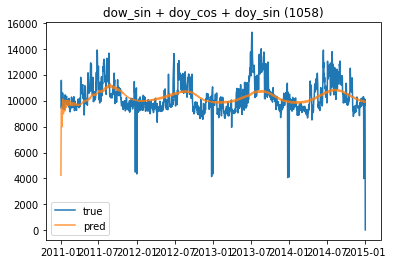

 56%|███████████████████████████████████████████                                  | 207/370 [08:14<12:09,  4.47s/it]

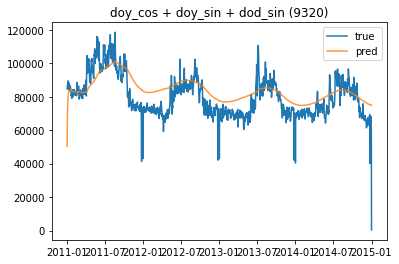

 56%|███████████████████████████████████████████▎                                 | 208/370 [08:18<12:00,  4.45s/it]

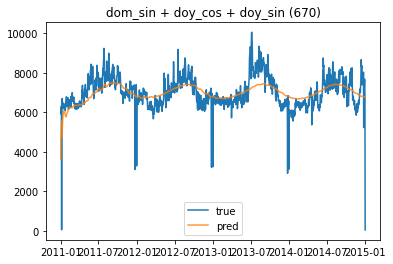

 56%|███████████████████████████████████████████▍                                 | 209/370 [08:23<12:01,  4.48s/it]

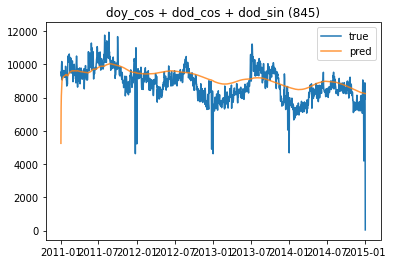

 57%|███████████████████████████████████████████▋                                 | 210/370 [08:27<11:56,  4.48s/it]

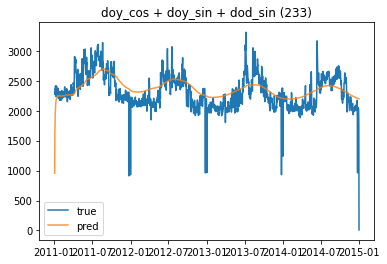

 57%|███████████████████████████████████████████▉                                 | 211/370 [08:32<11:52,  4.48s/it]

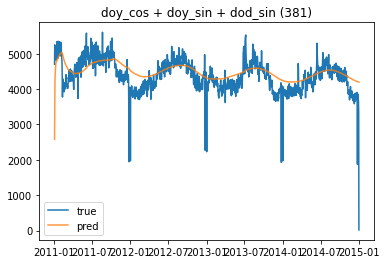

 57%|████████████████████████████████████████████                                 | 212/370 [08:36<11:48,  4.48s/it]

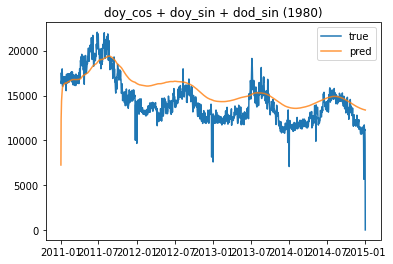

 58%|████████████████████████████████████████████▎                                | 213/370 [08:40<11:39,  4.45s/it]

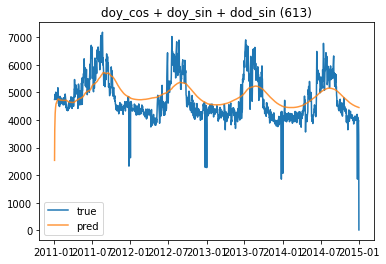

 58%|████████████████████████████████████████████▌                                | 214/370 [08:45<11:34,  4.45s/it]

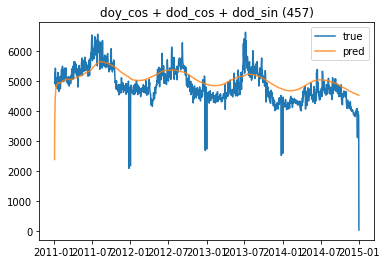

 58%|████████████████████████████████████████████▋                                | 215/370 [08:49<11:32,  4.47s/it]

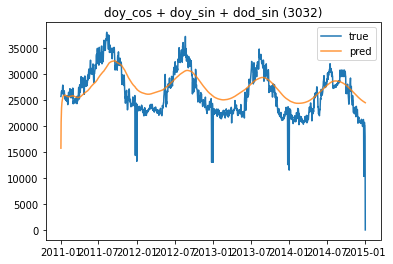

 58%|████████████████████████████████████████████▉                                | 216/370 [08:54<11:30,  4.48s/it]

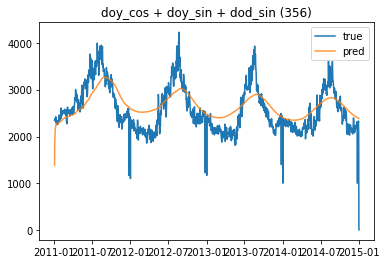

 59%|█████████████████████████████████████████████▏                               | 217/370 [08:58<11:25,  4.48s/it]

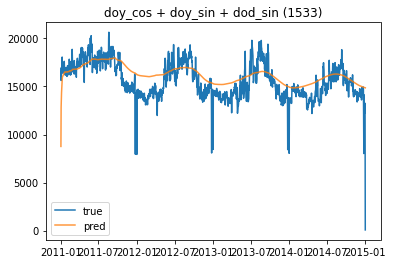

 59%|█████████████████████████████████████████████▎                               | 218/370 [09:03<11:23,  4.50s/it]

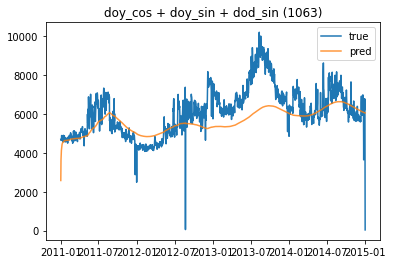

 59%|█████████████████████████████████████████████▌                               | 219/370 [09:07<11:14,  4.47s/it]

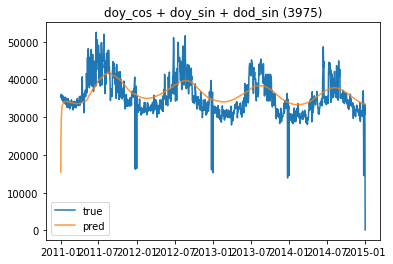

 59%|█████████████████████████████████████████████▊                               | 220/370 [09:13<11:44,  4.69s/it]

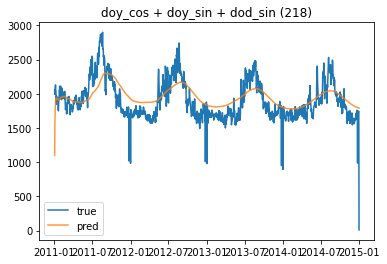

 60%|█████████████████████████████████████████████▉                               | 221/370 [09:17<11:42,  4.71s/it]

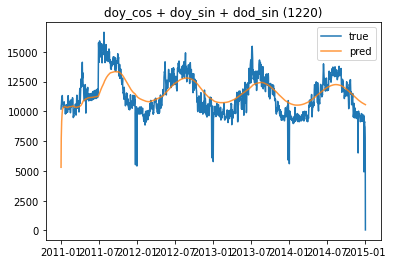

 60%|██████████████████████████████████████████████▏                              | 222/370 [09:22<11:39,  4.73s/it]

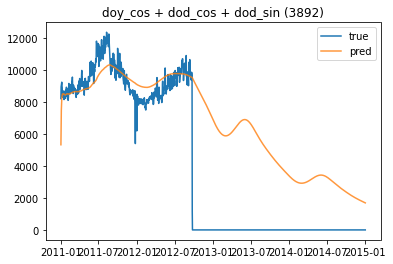

 60%|██████████████████████████████████████████████▍                              | 223/370 [09:27<11:38,  4.75s/it]

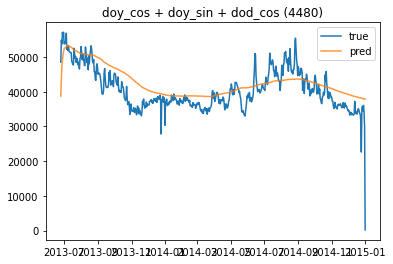

 61%|██████████████████████████████████████████████▌                              | 224/370 [09:28<08:52,  3.65s/it]

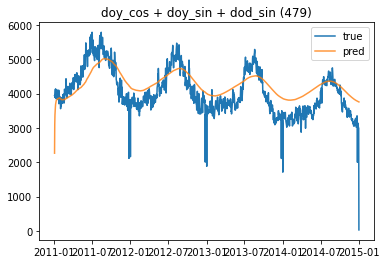

 61%|██████████████████████████████████████████████▊                              | 225/370 [09:33<09:41,  4.01s/it]

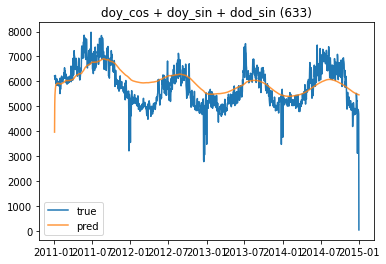

 61%|███████████████████████████████████████████████                              | 226/370 [09:38<10:09,  4.23s/it]

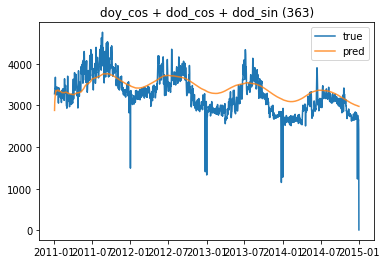

 61%|███████████████████████████████████████████████▏                             | 227/370 [09:42<10:24,  4.37s/it]

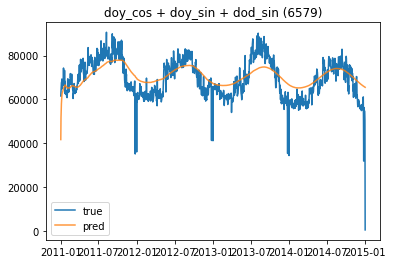

 62%|███████████████████████████████████████████████▍                             | 228/370 [09:47<10:27,  4.42s/it]

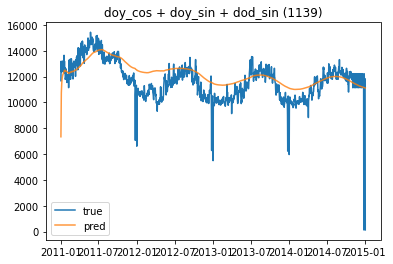

 62%|███████████████████████████████████████████████▋                             | 229/370 [09:51<10:29,  4.46s/it]

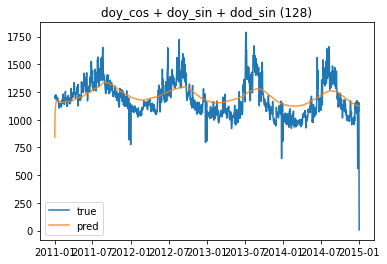

 62%|███████████████████████████████████████████████▊                             | 230/370 [09:56<10:30,  4.50s/it]

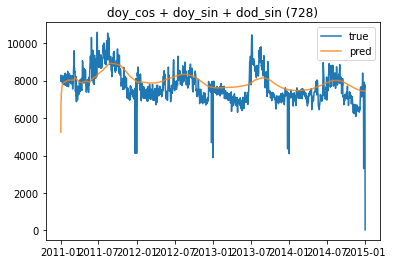

 62%|████████████████████████████████████████████████                             | 231/370 [10:01<10:44,  4.63s/it]

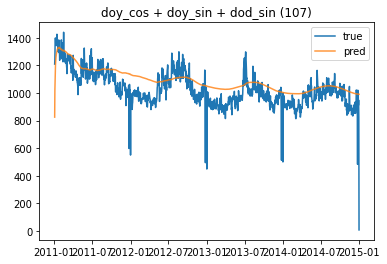

 63%|████████████████████████████████████████████████▎                            | 232/370 [10:06<10:40,  4.64s/it]

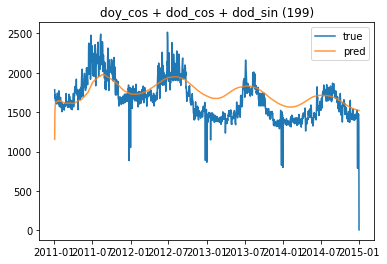

 63%|████████████████████████████████████████████████▍                            | 233/370 [10:10<10:32,  4.61s/it]

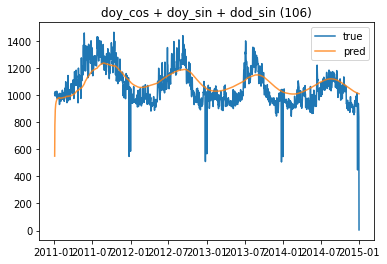

 63%|████████████████████████████████████████████████▋                            | 234/370 [10:15<10:32,  4.65s/it]

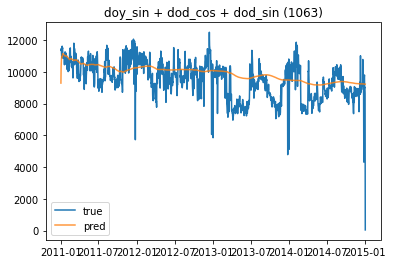

 64%|████████████████████████████████████████████████▉                            | 235/370 [10:19<10:26,  4.64s/it]

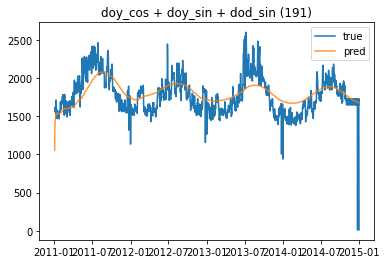

 64%|█████████████████████████████████████████████████                            | 236/370 [10:24<10:17,  4.61s/it]

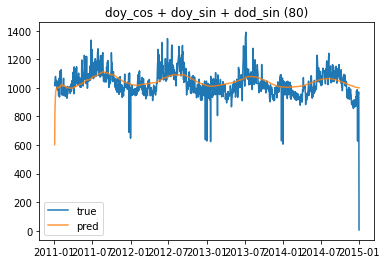

 64%|█████████████████████████████████████████████████▎                           | 237/370 [10:28<10:07,  4.57s/it]

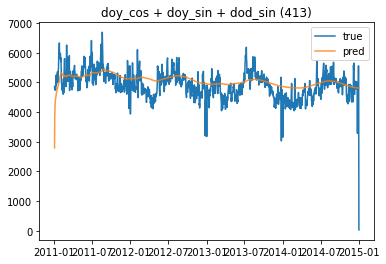

 64%|█████████████████████████████████████████████████▌                           | 238/370 [10:33<10:04,  4.58s/it]

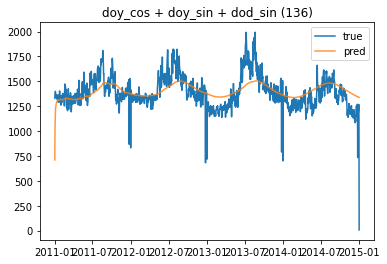

 65%|█████████████████████████████████████████████████▋                           | 239/370 [10:38<10:04,  4.62s/it]

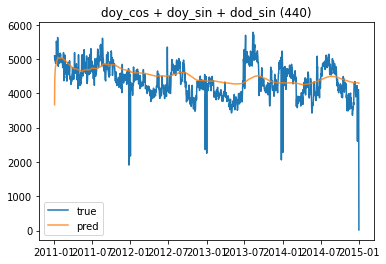

 65%|█████████████████████████████████████████████████▉                           | 240/370 [10:42<09:56,  4.59s/it]

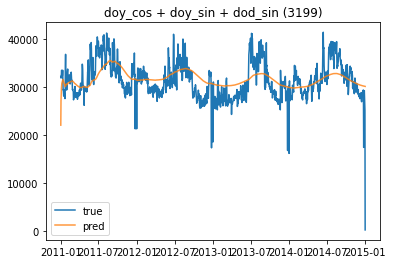

 65%|██████████████████████████████████████████████████▏                          | 241/370 [10:47<09:48,  4.57s/it]

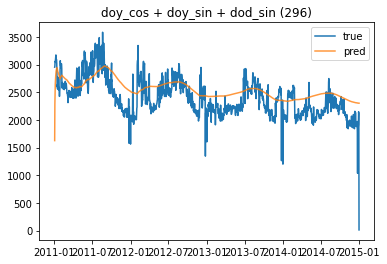

 65%|██████████████████████████████████████████████████▎                          | 242/370 [10:51<09:40,  4.53s/it]

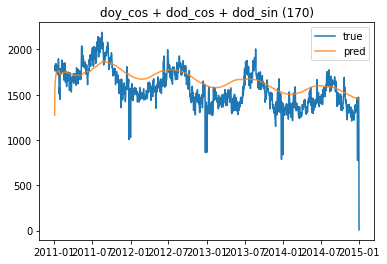

 66%|██████████████████████████████████████████████████▌                          | 243/370 [10:56<09:41,  4.57s/it]

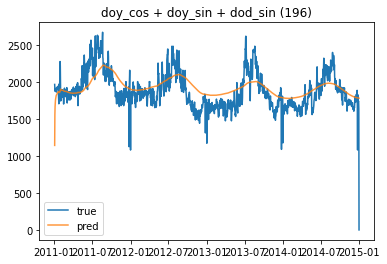

 66%|██████████████████████████████████████████████████▊                          | 244/370 [11:00<09:33,  4.55s/it]

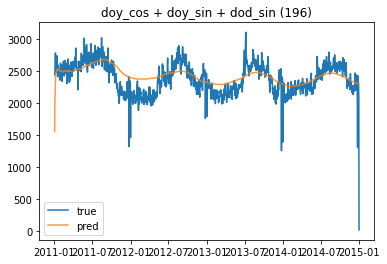

 66%|██████████████████████████████████████████████████▉                          | 245/370 [11:05<09:30,  4.56s/it]

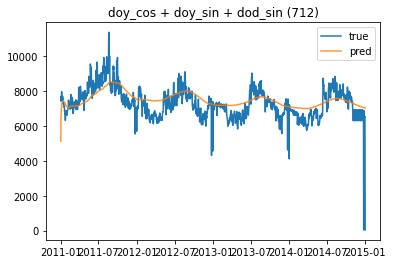

 66%|███████████████████████████████████████████████████▏                         | 246/370 [11:10<09:28,  4.59s/it]

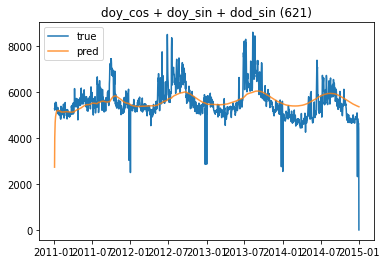

 67%|███████████████████████████████████████████████████▍                         | 247/370 [11:14<09:21,  4.56s/it]

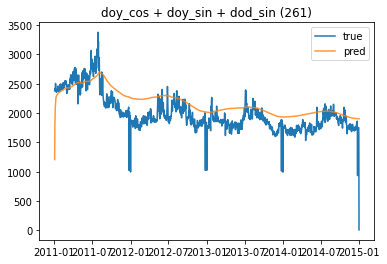

 67%|███████████████████████████████████████████████████▌                         | 248/370 [11:19<09:15,  4.55s/it]

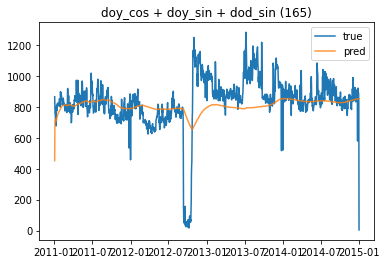

 67%|███████████████████████████████████████████████████▊                         | 249/370 [11:23<09:12,  4.57s/it]

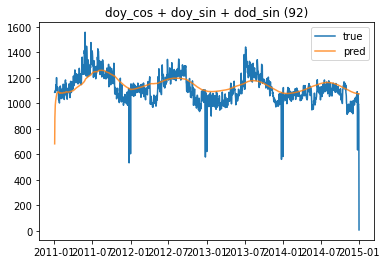

 68%|████████████████████████████████████████████████████                         | 250/370 [11:28<09:05,  4.55s/it]

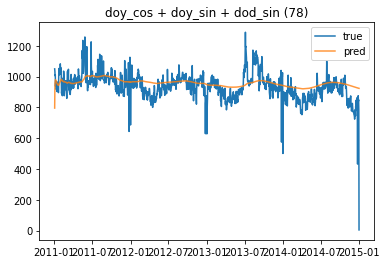

 68%|████████████████████████████████████████████████████▏                        | 251/370 [11:32<09:00,  4.54s/it]

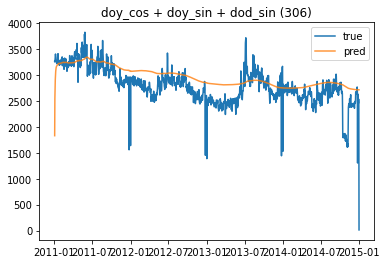

 68%|████████████████████████████████████████████████████▍                        | 252/370 [11:37<08:57,  4.55s/it]

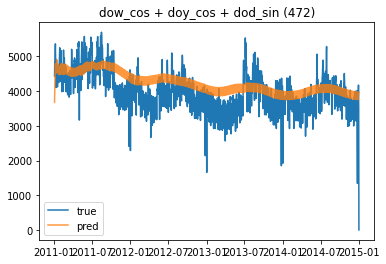

 68%|████████████████████████████████████████████████████▋                        | 253/370 [11:41<08:52,  4.55s/it]

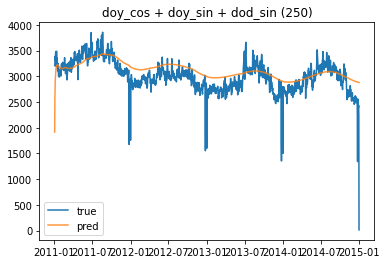

 69%|████████████████████████████████████████████████████▊                        | 254/370 [11:46<08:47,  4.54s/it]

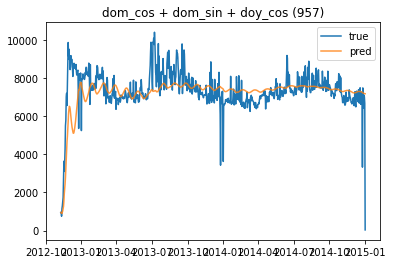

 69%|█████████████████████████████████████████████████████                        | 255/370 [11:47<06:52,  3.59s/it]

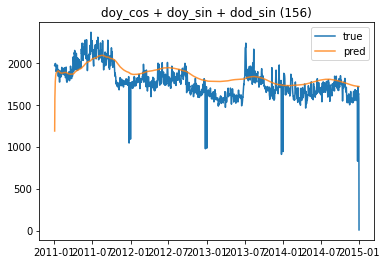

 69%|█████████████████████████████████████████████████████▎                       | 256/370 [11:52<07:19,  3.86s/it]

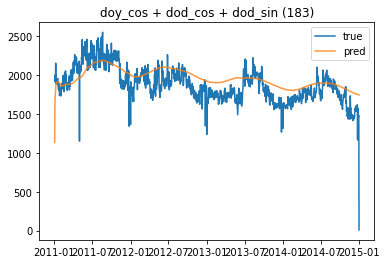

 69%|█████████████████████████████████████████████████████▍                       | 257/370 [11:57<07:45,  4.12s/it]

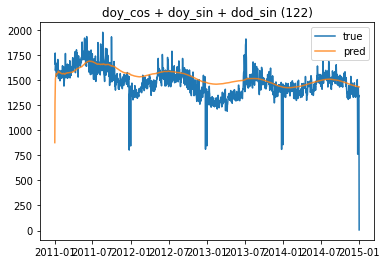

 70%|█████████████████████████████████████████████████████▋                       | 258/370 [12:01<07:59,  4.28s/it]

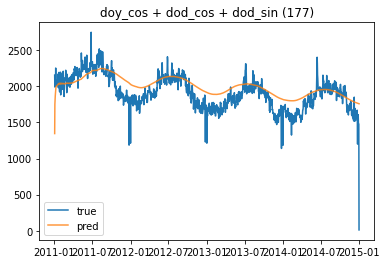

 70%|█████████████████████████████████████████████████████▉                       | 259/370 [12:06<08:05,  4.37s/it]

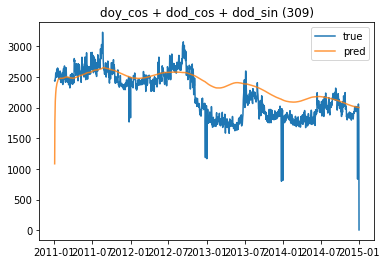

 70%|██████████████████████████████████████████████████████                       | 260/370 [12:10<08:07,  4.44s/it]

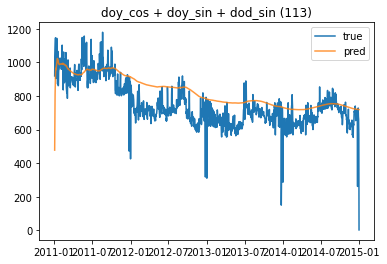

 71%|██████████████████████████████████████████████████████▎                      | 261/370 [12:15<08:09,  4.49s/it]

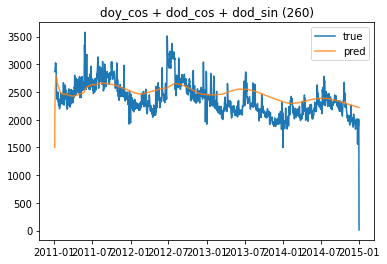

 71%|██████████████████████████████████████████████████████▌                      | 262/370 [12:20<08:14,  4.58s/it]

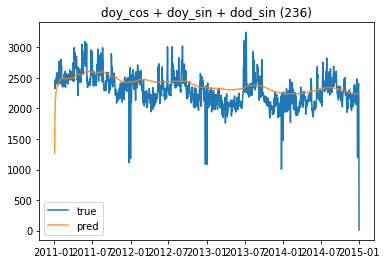

 71%|██████████████████████████████████████████████████████▋                      | 263/370 [12:25<08:15,  4.63s/it]

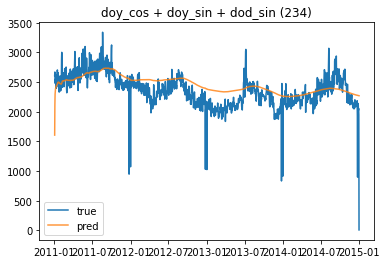

 71%|██████████████████████████████████████████████████████▉                      | 264/370 [12:29<08:17,  4.69s/it]

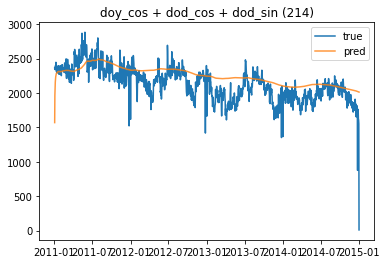

 72%|███████████████████████████████████████████████████████▏                     | 265/370 [12:34<08:16,  4.73s/it]

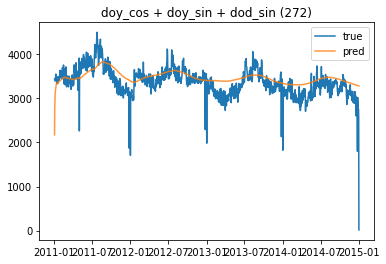

 72%|███████████████████████████████████████████████████████▎                     | 266/370 [12:39<08:08,  4.70s/it]

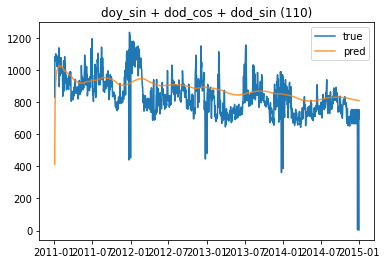

 72%|███████████████████████████████████████████████████████▌                     | 267/370 [12:43<08:00,  4.66s/it]

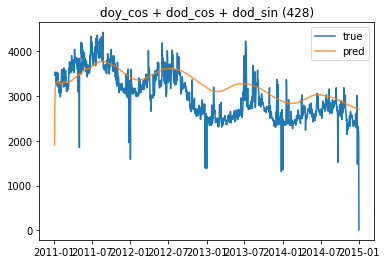

 72%|███████████████████████████████████████████████████████▊                     | 268/370 [12:48<07:52,  4.63s/it]

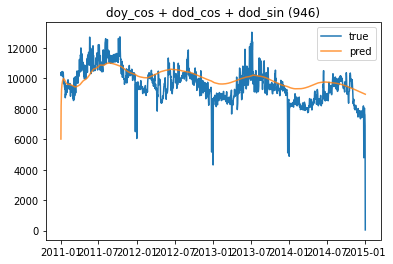

 73%|███████████████████████████████████████████████████████▉                     | 269/370 [12:53<07:46,  4.62s/it]

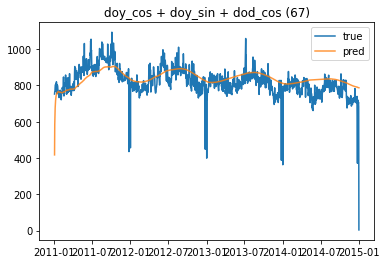

 73%|████████████████████████████████████████████████████████▏                    | 270/370 [12:57<07:40,  4.61s/it]

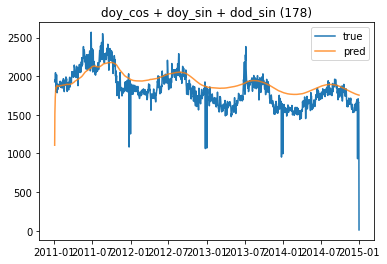

 73%|████████████████████████████████████████████████████████▍                    | 271/370 [13:02<07:36,  4.61s/it]

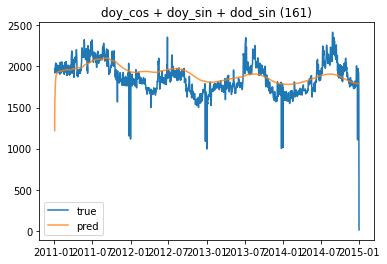

 74%|████████████████████████████████████████████████████████▌                    | 272/370 [13:06<07:31,  4.61s/it]

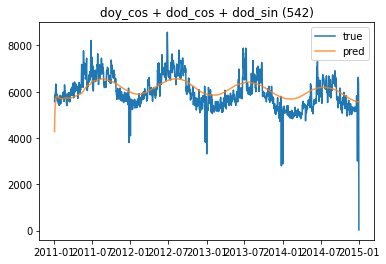

 74%|████████████████████████████████████████████████████████▊                    | 273/370 [13:11<07:27,  4.61s/it]

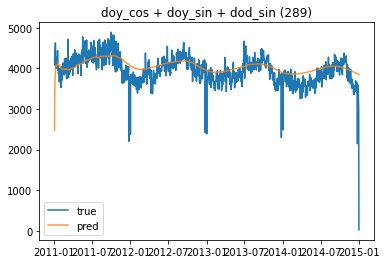

 74%|█████████████████████████████████████████████████████████                    | 274/370 [13:16<07:22,  4.61s/it]

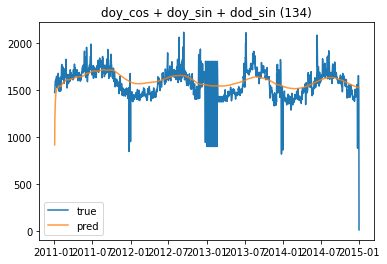

 74%|█████████████████████████████████████████████████████████▏                   | 275/370 [13:20<07:20,  4.64s/it]

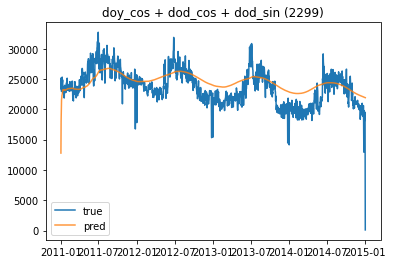

 75%|█████████████████████████████████████████████████████████▍                   | 276/370 [13:25<07:18,  4.66s/it]

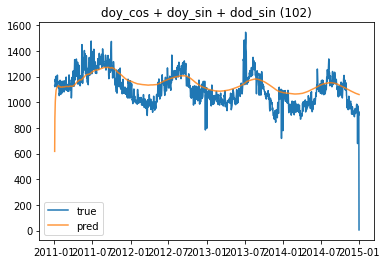

 75%|█████████████████████████████████████████████████████████▋                   | 277/370 [13:30<07:14,  4.67s/it]

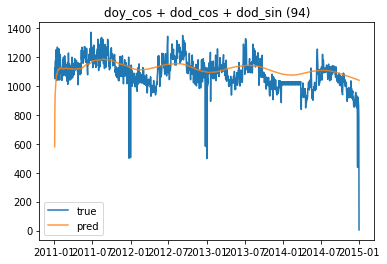

 75%|█████████████████████████████████████████████████████████▊                   | 278/370 [13:34<07:10,  4.68s/it]

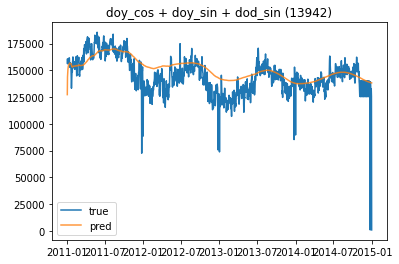

 75%|██████████████████████████████████████████████████████████                   | 279/370 [13:39<07:09,  4.72s/it]

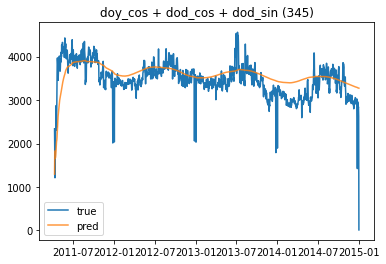

 76%|██████████████████████████████████████████████████████████▎                  | 280/370 [13:43<06:44,  4.50s/it]

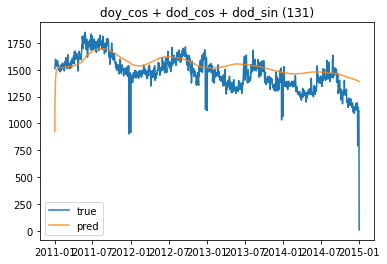

 76%|██████████████████████████████████████████████████████████▍                  | 281/370 [13:48<06:47,  4.58s/it]

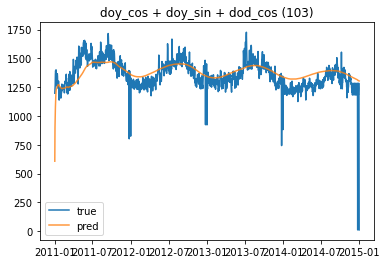

 76%|██████████████████████████████████████████████████████████▋                  | 282/370 [13:53<06:48,  4.64s/it]

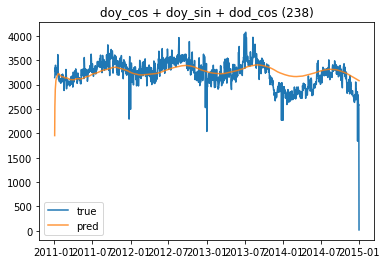

 76%|██████████████████████████████████████████████████████████▉                  | 283/370 [13:57<06:46,  4.68s/it]

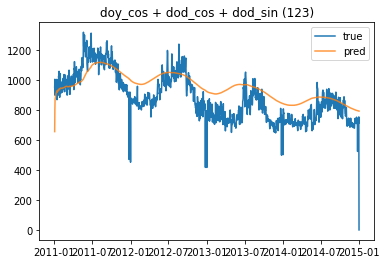

 77%|███████████████████████████████████████████████████████████                  | 284/370 [14:02<06:42,  4.68s/it]

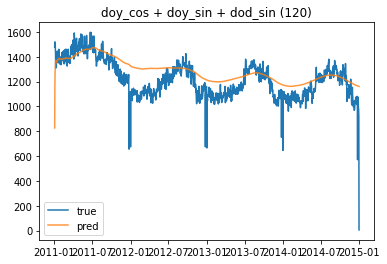

 77%|███████████████████████████████████████████████████████████▎                 | 285/370 [14:07<06:35,  4.66s/it]

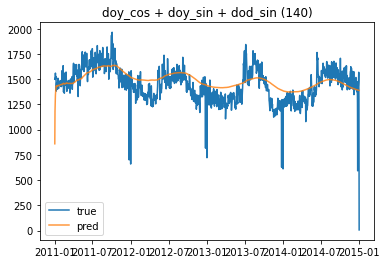

 77%|███████████████████████████████████████████████████████████▌                 | 286/370 [14:11<06:31,  4.67s/it]

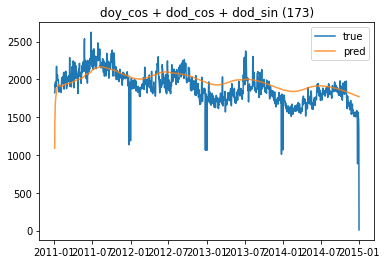

 78%|███████████████████████████████████████████████████████████▋                 | 287/370 [14:16<06:25,  4.65s/it]

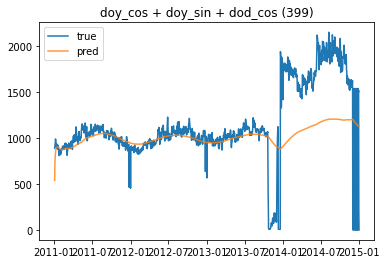

 78%|███████████████████████████████████████████████████████████▉                 | 288/370 [14:21<06:21,  4.66s/it]

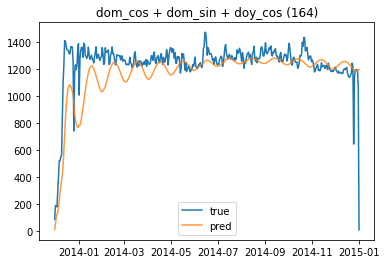

 78%|████████████████████████████████████████████████████████████▏                | 289/370 [14:21<04:42,  3.49s/it]

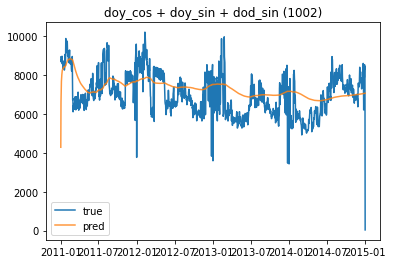

 78%|████████████████████████████████████████████████████████████▎                | 290/370 [14:26<05:08,  3.86s/it]

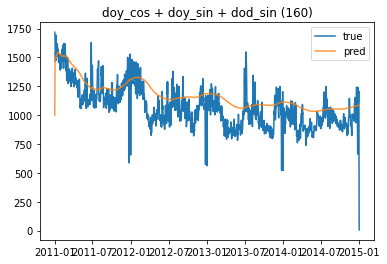

 79%|████████████████████████████████████████████████████████████▌                | 291/370 [14:31<05:25,  4.12s/it]

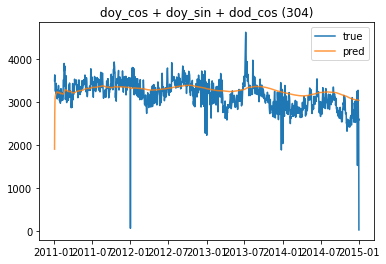

 79%|████████████████████████████████████████████████████████████▊                | 292/370 [14:36<05:32,  4.27s/it]

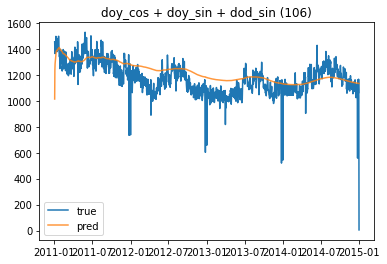

 79%|████████████████████████████████████████████████████████████▉                | 293/370 [14:40<05:37,  4.39s/it]

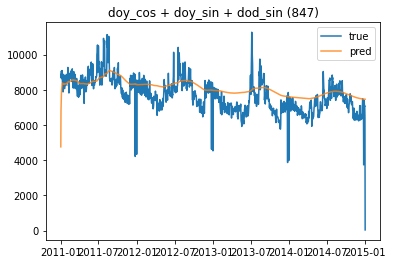

 79%|█████████████████████████████████████████████████████████████▏               | 294/370 [14:45<05:42,  4.50s/it]

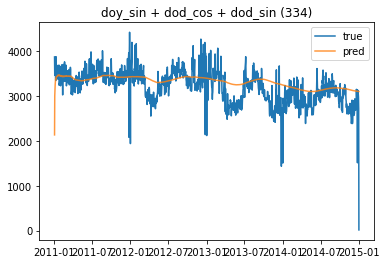

 80%|█████████████████████████████████████████████████████████████▍               | 295/370 [14:50<05:41,  4.55s/it]

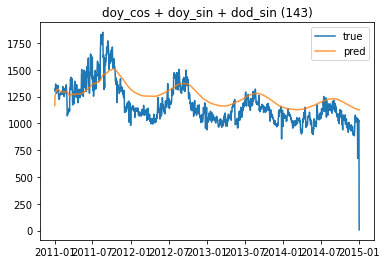

 80%|█████████████████████████████████████████████████████████████▌               | 296/370 [14:54<05:39,  4.58s/it]

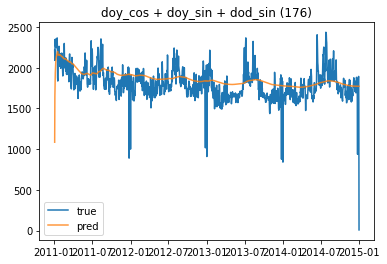

 80%|█████████████████████████████████████████████████████████████▊               | 297/370 [14:59<05:36,  4.61s/it]

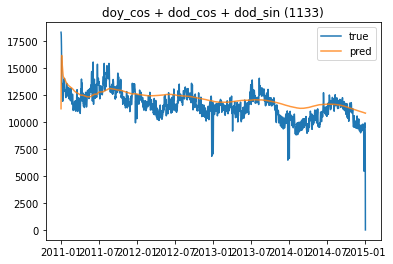

 81%|██████████████████████████████████████████████████████████████               | 298/370 [15:04<05:31,  4.60s/it]

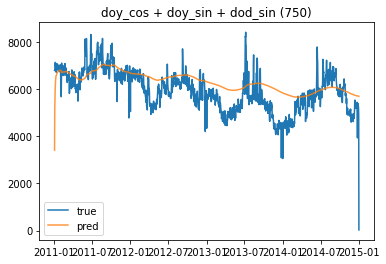

 81%|██████████████████████████████████████████████████████████████▏              | 299/370 [15:08<05:24,  4.57s/it]

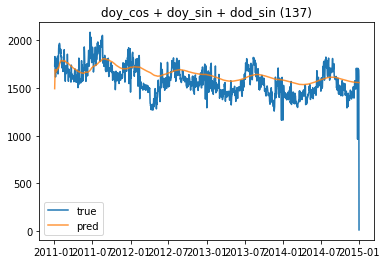

 81%|██████████████████████████████████████████████████████████████▍              | 300/370 [15:13<05:23,  4.62s/it]

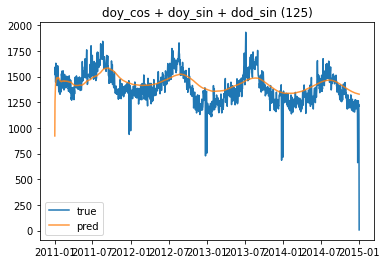

 81%|██████████████████████████████████████████████████████████████▋              | 301/370 [15:17<05:17,  4.60s/it]

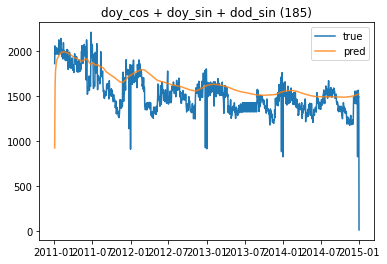

 82%|██████████████████████████████████████████████████████████████▊              | 302/370 [15:22<05:11,  4.58s/it]

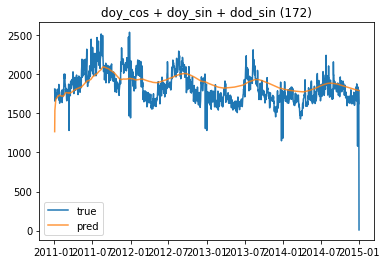

 82%|███████████████████████████████████████████████████████████████              | 303/370 [15:26<05:05,  4.56s/it]

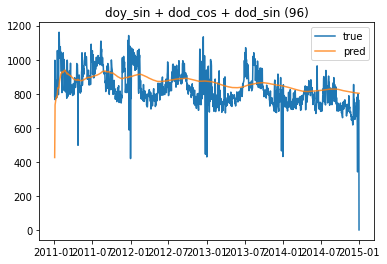

 82%|███████████████████████████████████████████████████████████████▎             | 304/370 [15:31<05:01,  4.57s/it]

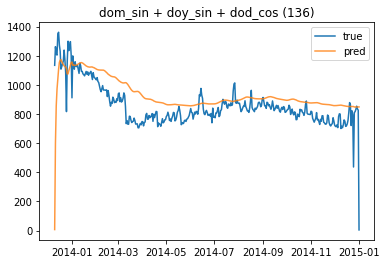

 82%|███████████████████████████████████████████████████████████████▍             | 305/370 [15:32<03:41,  3.41s/it]

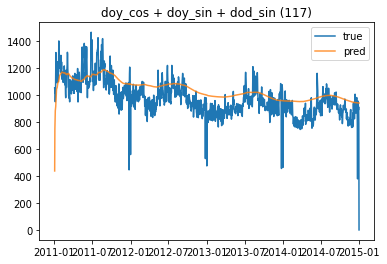

 83%|███████████████████████████████████████████████████████████████▋             | 306/370 [15:36<04:00,  3.75s/it]

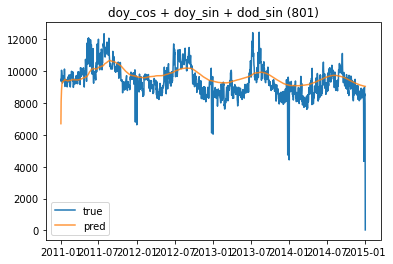

 83%|███████████████████████████████████████████████████████████████▉             | 307/370 [15:41<04:11,  3.99s/it]

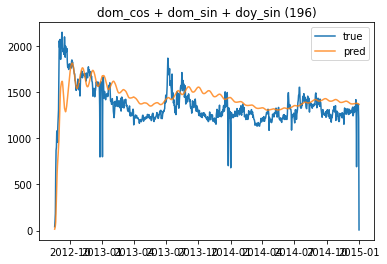

 83%|████████████████████████████████████████████████████████████████             | 308/370 [15:42<03:22,  3.26s/it]

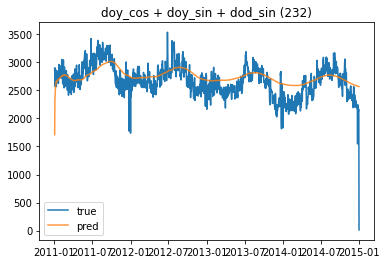

 84%|████████████████████████████████████████████████████████████████▎            | 309/370 [15:47<03:42,  3.64s/it]

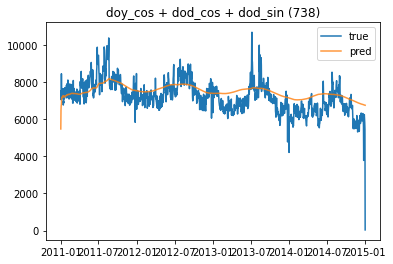

 84%|████████████████████████████████████████████████████████████████▌            | 310/370 [15:51<03:54,  3.91s/it]

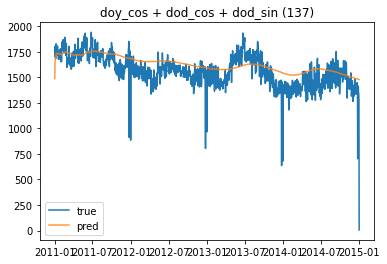

 84%|████████████████████████████████████████████████████████████████▋            | 311/370 [15:56<04:02,  4.10s/it]

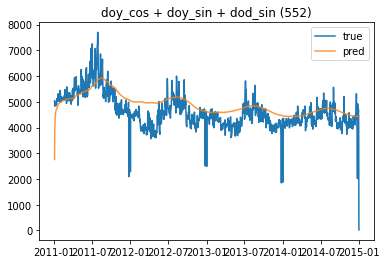

 84%|████████████████████████████████████████████████████████████████▉            | 312/370 [16:01<04:10,  4.31s/it]

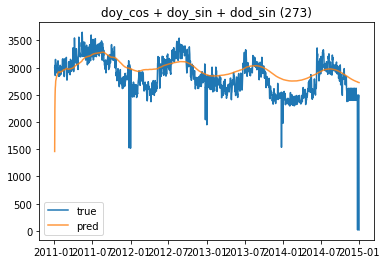

 85%|█████████████████████████████████████████████████████████████████▏           | 313/370 [16:05<04:09,  4.38s/it]

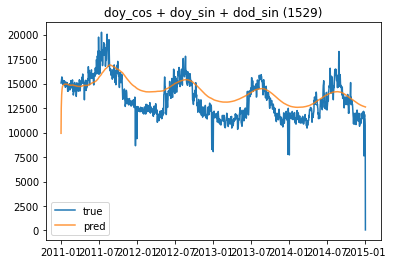

 85%|█████████████████████████████████████████████████████████████████▎           | 314/370 [16:10<04:08,  4.44s/it]

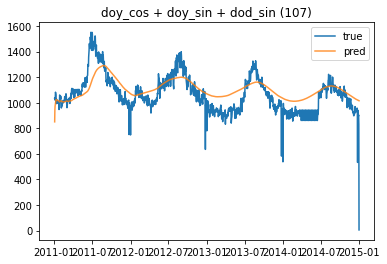

 85%|█████████████████████████████████████████████████████████████████▌           | 315/370 [16:14<04:06,  4.48s/it]

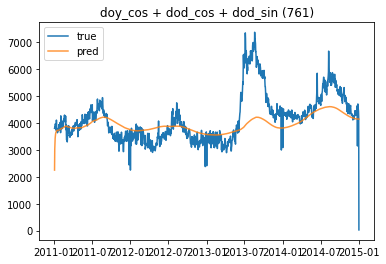

 85%|█████████████████████████████████████████████████████████████████▊           | 316/370 [16:19<04:01,  4.48s/it]

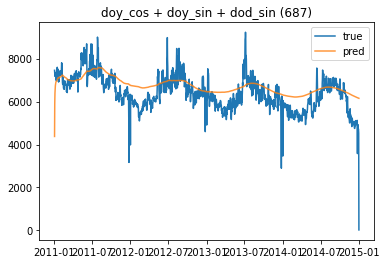

 86%|█████████████████████████████████████████████████████████████████▉           | 317/370 [16:24<03:59,  4.52s/it]

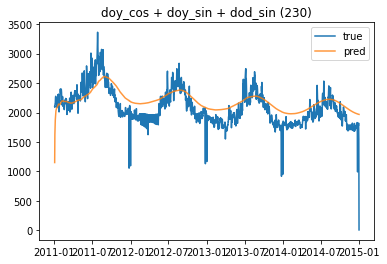

 86%|██████████████████████████████████████████████████████████████████▏          | 318/370 [16:28<03:56,  4.56s/it]

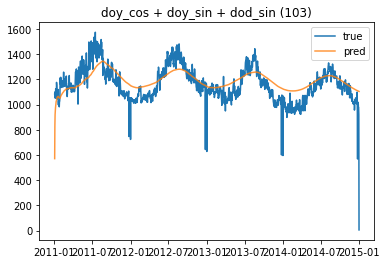

 86%|██████████████████████████████████████████████████████████████████▍          | 319/370 [16:33<03:54,  4.59s/it]

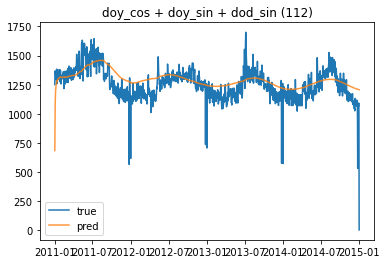

 86%|██████████████████████████████████████████████████████████████████▌          | 320/370 [16:37<03:48,  4.58s/it]

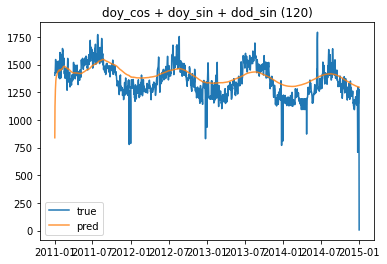

 87%|██████████████████████████████████████████████████████████████████▊          | 321/370 [16:42<03:46,  4.61s/it]

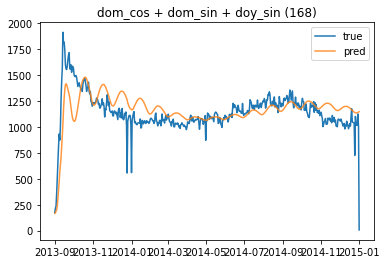

 87%|███████████████████████████████████████████████████████████████████          | 322/370 [16:43<02:48,  3.52s/it]

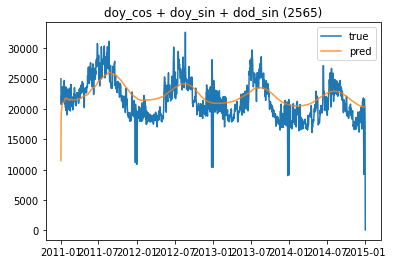

 87%|███████████████████████████████████████████████████████████████████▏         | 323/370 [16:48<03:01,  3.86s/it]

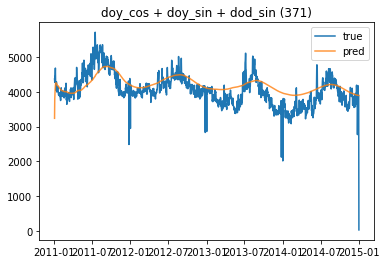

 88%|███████████████████████████████████████████████████████████████████▍         | 324/370 [16:52<03:08,  4.10s/it]

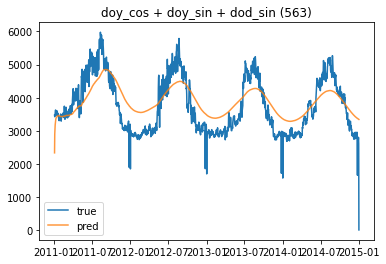

 88%|███████████████████████████████████████████████████████████████████▋         | 325/370 [16:57<03:12,  4.28s/it]

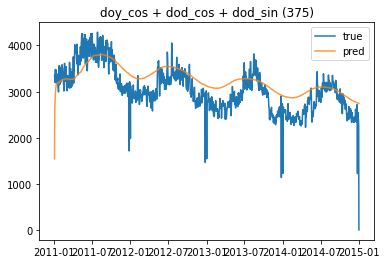

 88%|███████████████████████████████████████████████████████████████████▊         | 326/370 [17:01<03:07,  4.27s/it]

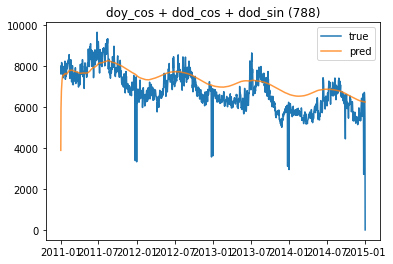

 88%|████████████████████████████████████████████████████████████████████         | 327/370 [17:06<03:05,  4.32s/it]

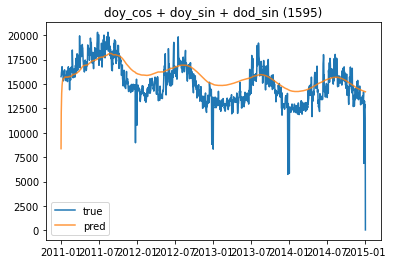

 89%|████████████████████████████████████████████████████████████████████▎        | 328/370 [17:10<03:04,  4.38s/it]

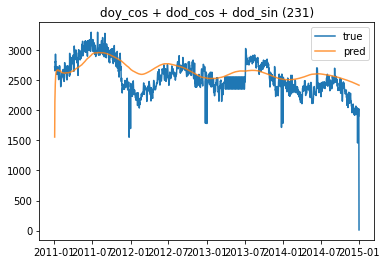

 89%|████████████████████████████████████████████████████████████████████▍        | 329/370 [17:15<03:00,  4.41s/it]

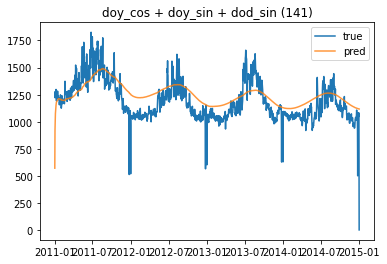

 89%|████████████████████████████████████████████████████████████████████▋        | 330/370 [17:19<02:57,  4.43s/it]

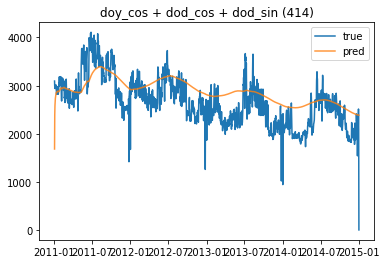

 89%|████████████████████████████████████████████████████████████████████▉        | 331/370 [17:24<02:54,  4.47s/it]

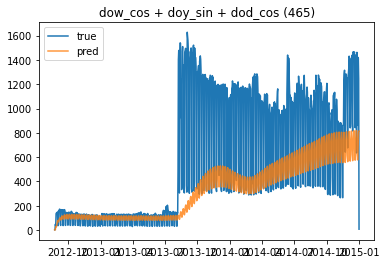

 90%|█████████████████████████████████████████████████████████████████████        | 332/370 [17:25<02:16,  3.59s/it]

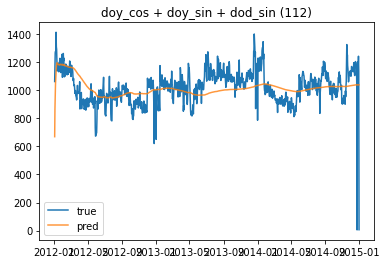

 90%|█████████████████████████████████████████████████████████████████████▎       | 333/370 [17:27<01:55,  3.12s/it]

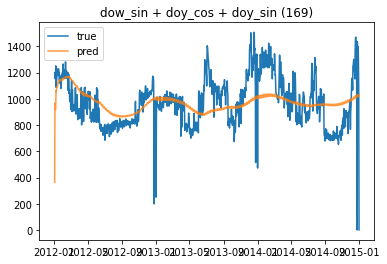

 90%|█████████████████████████████████████████████████████████████████████▌       | 334/370 [17:29<01:40,  2.79s/it]

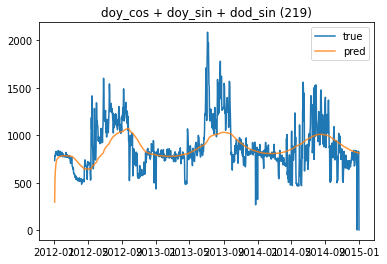

 91%|█████████████████████████████████████████████████████████████████████▋       | 335/370 [17:31<01:29,  2.56s/it]

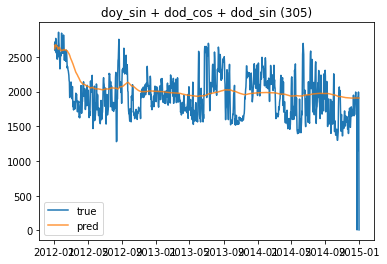

 91%|█████████████████████████████████████████████████████████████████████▉       | 336/370 [17:33<01:21,  2.39s/it]

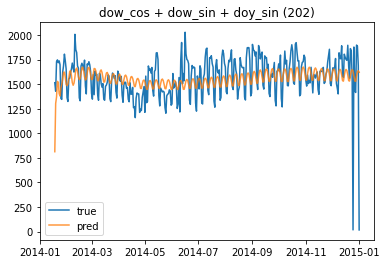

 91%|██████████████████████████████████████████████████████████████████████▏      | 337/370 [17:34<01:01,  1.86s/it]

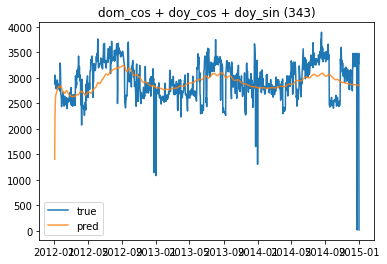

 91%|██████████████████████████████████████████████████████████████████████▎      | 338/370 [17:36<01:00,  1.90s/it]

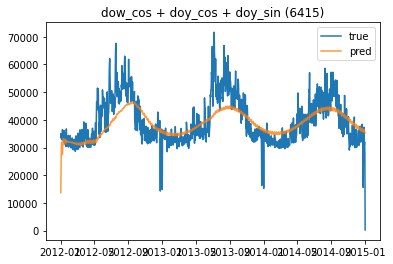

 92%|██████████████████████████████████████████████████████████████████████▌      | 339/370 [17:38<00:59,  1.93s/it]

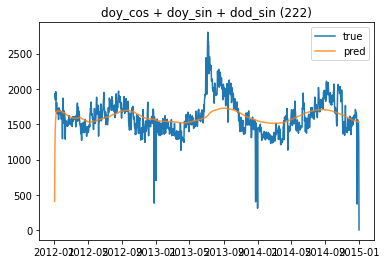

 92%|██████████████████████████████████████████████████████████████████████▊      | 340/370 [17:40<00:58,  1.95s/it]

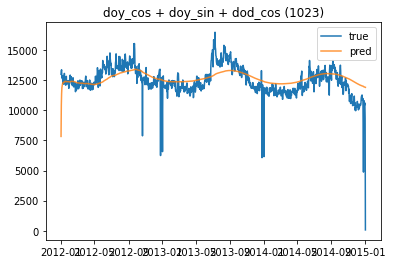

 92%|██████████████████████████████████████████████████████████████████████▉      | 341/370 [17:42<00:56,  1.95s/it]

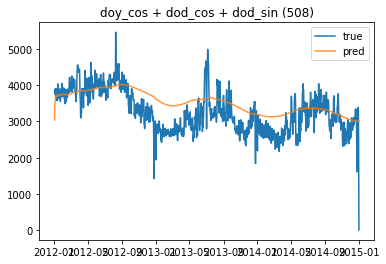

 92%|███████████████████████████████████████████████████████████████████████▏     | 342/370 [17:44<00:54,  1.94s/it]

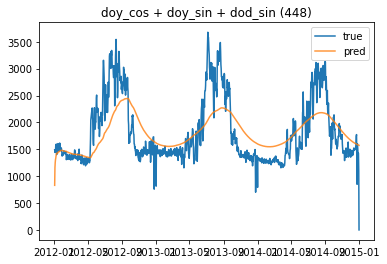

 93%|███████████████████████████████████████████████████████████████████████▍     | 343/370 [17:46<00:52,  1.96s/it]

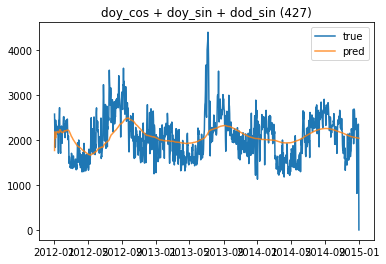

 93%|███████████████████████████████████████████████████████████████████████▌     | 344/370 [17:48<00:51,  1.97s/it]

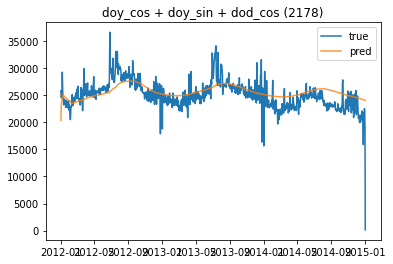

 93%|███████████████████████████████████████████████████████████████████████▊     | 345/370 [17:50<00:49,  1.97s/it]

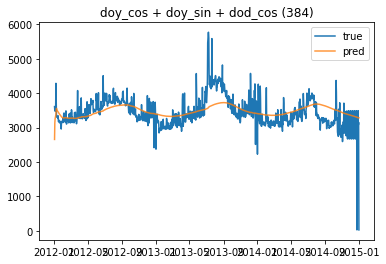

 94%|████████████████████████████████████████████████████████████████████████     | 346/370 [17:52<00:47,  1.96s/it]

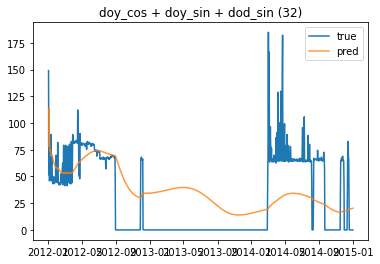

 94%|████████████████████████████████████████████████████████████████████████▏    | 347/370 [17:54<00:45,  1.96s/it]

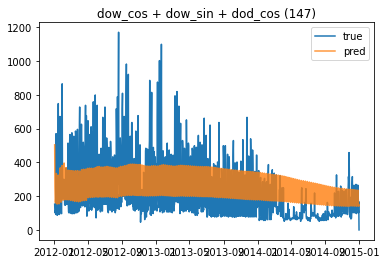

 94%|████████████████████████████████████████████████████████████████████████▍    | 348/370 [17:56<00:42,  1.95s/it]

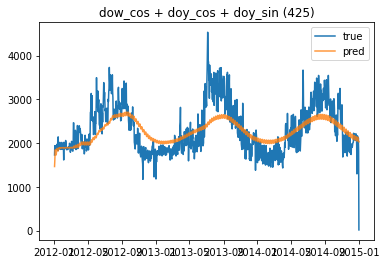

 94%|████████████████████████████████████████████████████████████████████████▋    | 349/370 [17:58<00:41,  1.96s/it]

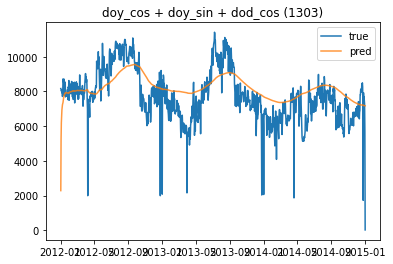

 95%|████████████████████████████████████████████████████████████████████████▊    | 350/370 [18:00<00:39,  1.96s/it]

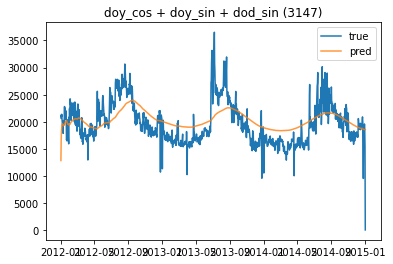

 95%|█████████████████████████████████████████████████████████████████████████    | 351/370 [18:02<00:37,  1.97s/it]

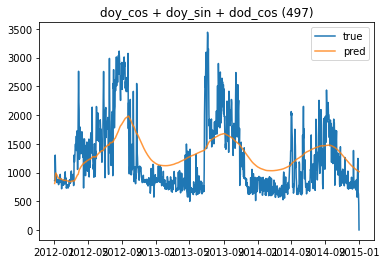

 95%|█████████████████████████████████████████████████████████████████████████▎   | 352/370 [18:04<00:35,  1.96s/it]

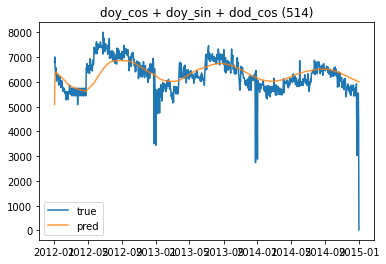

 95%|█████████████████████████████████████████████████████████████████████████▍   | 353/370 [18:06<00:33,  1.96s/it]

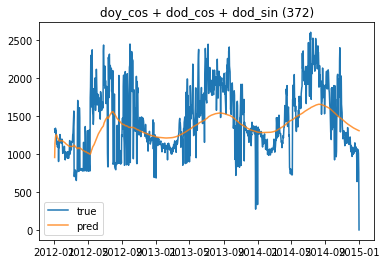

 96%|█████████████████████████████████████████████████████████████████████████▋   | 354/370 [18:08<00:32,  2.00s/it]

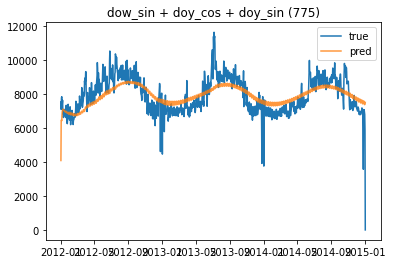

 96%|█████████████████████████████████████████████████████████████████████████▉   | 355/370 [18:10<00:29,  1.97s/it]

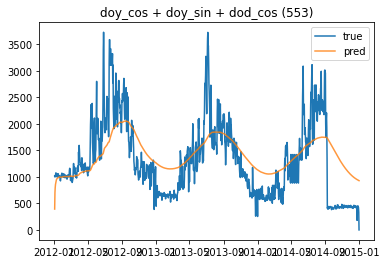

 96%|██████████████████████████████████████████████████████████████████████████   | 356/370 [18:12<00:27,  1.99s/it]

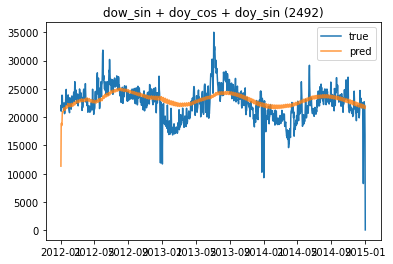

 96%|██████████████████████████████████████████████████████████████████████████▎  | 357/370 [18:14<00:25,  2.00s/it]

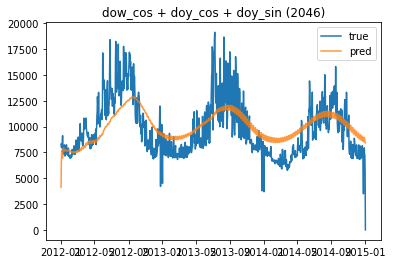

 97%|██████████████████████████████████████████████████████████████████████████▌  | 358/370 [18:16<00:24,  2.02s/it]

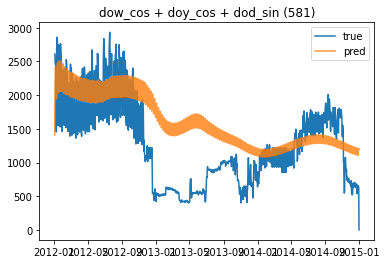

 97%|██████████████████████████████████████████████████████████████████████████▋  | 359/370 [18:18<00:22,  2.03s/it]

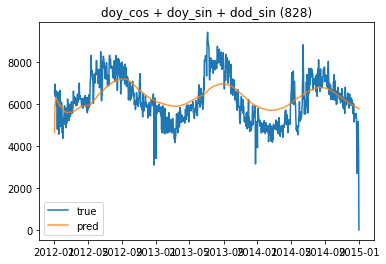

 97%|██████████████████████████████████████████████████████████████████████████▉  | 360/370 [18:20<00:20,  2.03s/it]

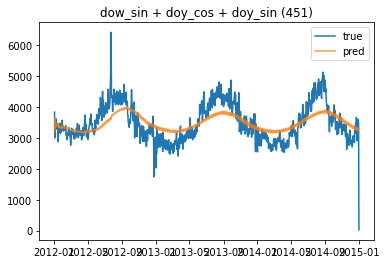

 98%|███████████████████████████████████████████████████████████████████████████▏ | 361/370 [18:22<00:18,  2.03s/it]

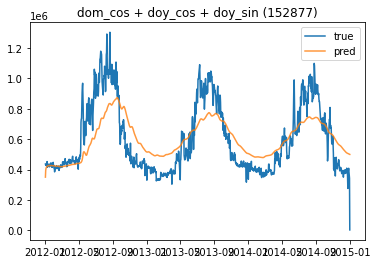

 98%|███████████████████████████████████████████████████████████████████████████▎ | 362/370 [18:24<00:16,  2.06s/it]

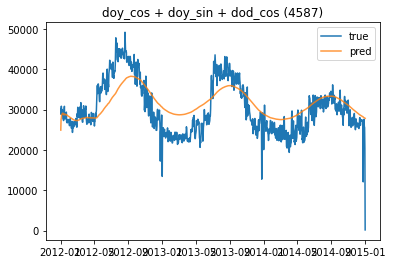

 98%|███████████████████████████████████████████████████████████████████████████▌ | 363/370 [18:26<00:14,  2.02s/it]

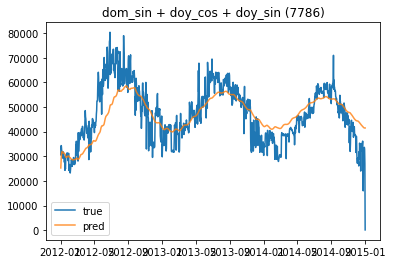

 98%|███████████████████████████████████████████████████████████████████████████▊ | 364/370 [18:28<00:12,  2.05s/it]

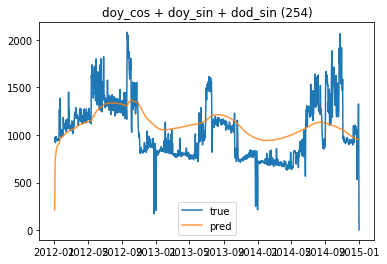

 99%|███████████████████████████████████████████████████████████████████████████▉ | 365/370 [18:30<00:10,  2.10s/it]

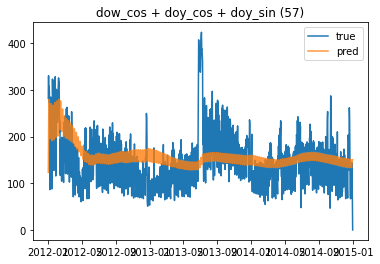

 99%|████████████████████████████████████████████████████████████████████████████▏| 366/370 [18:32<00:08,  2.05s/it]

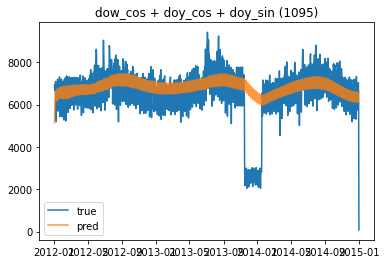

 99%|████████████████████████████████████████████████████████████████████████████▍| 367/370 [18:34<00:06,  2.02s/it]

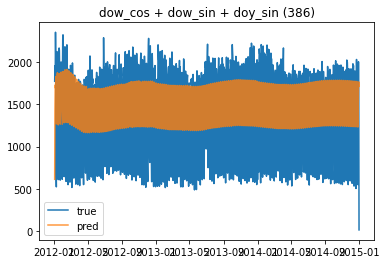

 99%|████████████████████████████████████████████████████████████████████████████▌| 368/370 [18:36<00:04,  2.04s/it]

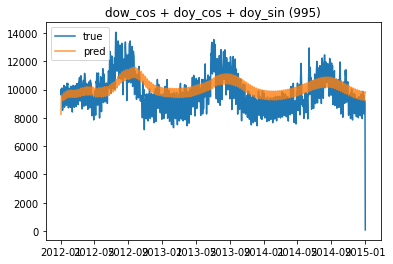

100%|████████████████████████████████████████████████████████████████████████████▊| 369/370 [18:38<00:02,  2.03s/it]

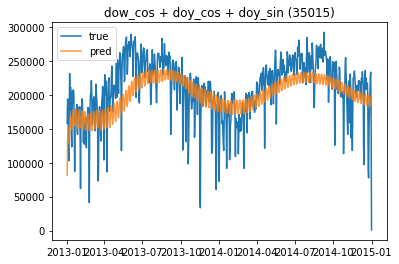

100%|█████████████████████████████████████████████████████████████████████████████| 370/370 [18:39<00:00,  3.03s/it]


In [65]:
for df in tqdm.tqdm(dfs):
    plot_best_mask(df)

In [37]:
dfs[0].values[3]

array([ -0.90096887,   0.43388374,  -0.9781476 ,  -0.20791169,
         0.97964149,  -0.20075493,   0.82073174,   0.57131376,
       136.73857868])

In [38]:
dfs[0].columns

Index(['dow_cos', 'dow_sin', 'dom_cos', 'dom_sin', 'doy_cos', 'doy_sin',
       'dod_cos', 'dod_sin', 'demand'],
      dtype='object')

In [51]:
for i in range(10):
    c, s, *_ = dfs[0].values[i]
    print("i, c, s")
    print(i, c, s)
    print("math.acos(c) / (2 * math.pi)")
    print(math.acos(c) / (2 * math.pi))
    print("math.asin(s) / (2 * math.pi)")
    print(math.asin(s) / (2 * math.pi))
    print("math.acos(c) / (2 * math.pi) / (math.asin(s) / (2 * math.pi))")
    print(math.acos(c) / (2 * math.pi) / (math.asin(s) / (2 * math.pi)))
    print("atan(_)")
    print(math.atan(-math.acos(c) / (2 * math.pi) / (math.asin(s) / (2 * math.pi))))
    print()

i, c, s
0 1.0 -8.256492794042734e-11
math.acos(c) / (2 * math.pi)
0.0
math.asin(s) / (2 * math.pi)
-1.3140616407745154e-11
math.acos(c) / (2 * math.pi) / (math.asin(s) / (2 * math.pi))
-0.0
atan(_)
0.0

i, c, s
1 0.6234898018984257 0.7818314824363763
math.acos(c) / (2 * math.pi)
0.14285714284906284
math.asin(s) / (2 * math.pi)
0.14285714284906284
math.acos(c) / (2 * math.pi) / (math.asin(s) / (2 * math.pi))
1.0
atan(_)
-0.7853981633974483

i, c, s
2 -0.22252093393781863 0.9749279121860451
math.acos(c) / (2 * math.pi)
0.28571428571126634
math.asin(s) / (2 * math.pi)
0.2142857142887337
math.acos(c) / (2 * math.pi) / (math.asin(s) / (2 * math.pi))
1.3333333333004556
atan(_)
-0.9272952179897762

i, c, s
3 -0.9009688679079838 0.4338837391060029
math.acos(c) / (2 * math.pi)
0.4285714285734698
math.asin(s) / (2 * math.pi)
0.07142857142653022
math.acos(c) / (2 * math.pi) / (math.asin(s) / (2 * math.pi))
6.000000000200038
atan(_)
-1.4056476493856762

i, c, s
4 -0.900968867933569 -0.433883739052

In [52]:
math.acos(c) / (2 * math.pi)

0.2857142857096345

In [53]:
math.asin(s) / (2 * math.pi)

0.2142857142903656

In [54]:
math.acos(c) / (2 * math.pi) / (math.asin(s) / (2 * math.pi))

1.333333333282686

In [ ]:
c, s, *_ = dfs[0].values[0]
c, s